### Lab assignment: the hunger games
by Angel Fernández Vitos

<table><tr>
    <td><img src="https://albarji-labs-materials.s3-eu-west-1.amazonaws.com/breakfast.jpg" style="width:300px;height:300px;"></td>
    <td><img src="https://albarji-labs-materials.s3-eu-west-1.amazonaws.com/hamburger.jpg" style="width:300px;height:300px;"></td>
    <td><img src="https://albarji-labs-materials.s3-eu-west-1.amazonaws.com/fruits.jpg" style="width:300px;height:300px;"></td>
</tr></table>

In this assignment we will face a challenging image classification problem, building a deep learning model that is able to classify different kinds of foods. Let the hunger games begin!

To avoid missing packages and compatibility issues you should run this notebook under one of the [recommended Deep Learning environment files](https://github.com/albarji/teaching-environments/tree/master/deeplearning), or make use of [Google Colaboratory](https://colab.research.google.com/). If you use Colaboratory make sure to [activate GPU support](https://colab.research.google.com/notebooks/gpu.ipynb).

The following code will embed any plots into the notebook instead of generating a new window:

In [7]:
import matplotlib.pyplot as plt
%matplotlib inline

## Data acquisition

We will use a food images dataset available at [Kaggle](https://www.kaggle.com/trolukovich/food11-image-dataset). To download it you will need to create a user account in Kaggle, and obtain your API credential by following the instructions on [this section](https://github.com/Kaggle/kaggle-api#api-credentials). Once you have your credentials JSON file, you can inform this notebook of them by setting the appropriate enviroment variables, as follows

    import os

    os.environ["KAGGLE_USERNAME"] = "YOUR KAGGLE USERNAME HERE"
    os.environ["KAGGLE_KEY"] = "YOUR KAGGLE KEY HERE"
    
Once this is done, you will be able to download the dataset to this computer using the command

    !kaggle datasets download trolukovich/food11-image-dataset --unzip -p YOUR_LOCAL_FOLDER
    
where you should write a valid directory in your computer in "YOUR_LOCAL_FOLDER". If you are fine with downloading the data in the same folder as this notebook, just skip the `-p YOUR_LOCAL_FOLDER` part of the command.

In [8]:
pip install kaggle

In [9]:
import os

os.environ["KAGGLE_USERNAME"] = "fevianca"
os.environ["KAGGLE_KEY"] = "d5874a556eaa10e1ce2e0d5f6397dc69"

!kaggle datasets download trolukovich/food11-image-dataset --unzip #-p YOUR_LOCAL_FOLDER

100% 1.08G/1.08G [00:12<00:00, 75.1MB/s]
100% 1.08G/1.08G [00:12<00:00, 92.7MB/s]


Take now a look into the folder where you downloaded the data. You will find it is made up of three subfolders:

* **training**, containing the images to use to train the model.
* **validation**, containing additional images you could use as more training data, or for some kind of validation strategy such as Early Stopping.
* **evaluation**, containing the images you must use to test your model. Images in this folder can **only** be used to measure the model performance after the training procedure is completed.

Furthermore, within each one of these folders you will find one folder for each one of the 11 classes in this problem:

* Bread
* Dairy product
* Dessert
* Egg
* Fried food
* Meat
* Noodles-Pasta
* Rice
* Seafood
* Soup
* Vegetable-Fruit

This is a standard structure for organizing image datasets: one folder per class. To easen the following data processing steps, let us define some variables telling us where the data is located.

In [10]:
TRAINDIR = './training'
VALDIR = './validation'
TESTDIR = './evaluation'

Let's plot a random sample of training images from each class, using the ipyplot package. If you are running this notebook in Google Colab, you will need to install this package first with

    !pip install ipyplot

You can inspect each class by clicking the different tabs in the interface that will appear when running the following cell.

In [11]:
!pip install ipyplot


        WARNING! Google Colab Environment detected!
        You might encounter issues while running in Google Colab environment.
        If images are not displaying properly please try setting `base_64` param to `True`.
        



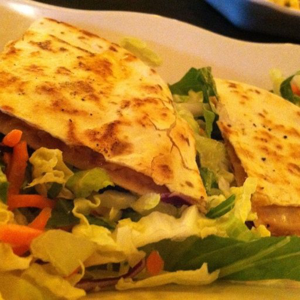
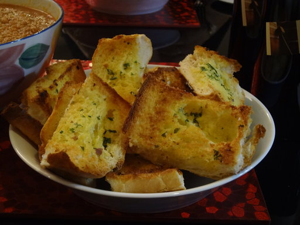
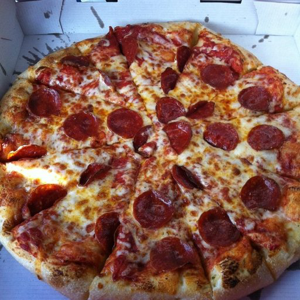
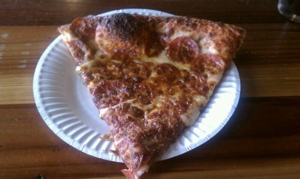
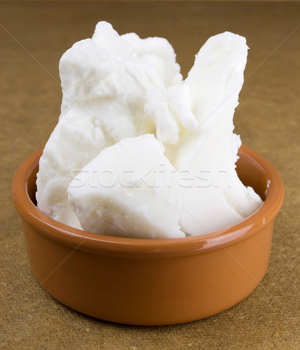
...
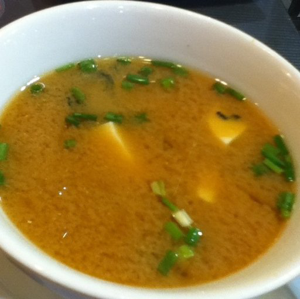
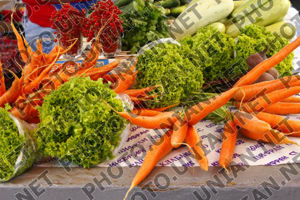
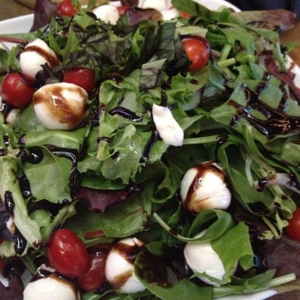
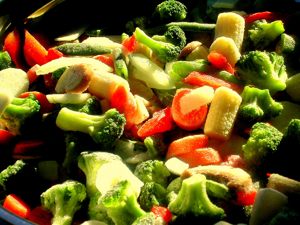
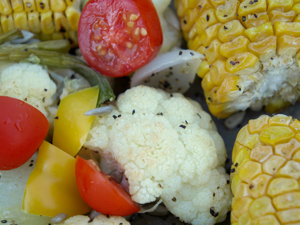

In [12]:
from glob import glob
import ipyplot
import numpy as np

all_images = glob(f"{TRAINDIR}/*/*.jpg")  # Get all image paths
np.random.shuffle(all_images)  # Randomize to show different images each run
all_labels = [f.split("/")[-2] for f in all_images]  # Extract class names from path

ipyplot.plot_class_tabs(all_images, all_labels, max_imgs_per_tab=4, img_width=300, force_b64=True)

### Class reduction

To make the problem more approachable, we will focus on just six classes: `Bread`, `Dairy product`, `Dessert`, `Egg`, `Fried food` and `Meat`. To do so, we will delete from the downloaded data the folders from other classes.

In [7]:
from glob import glob
import os

valid_classes = {"Bread", "Dairy product", "Dessert", "Egg", "Fried food", "Meat"}
datasets = {TRAINDIR, VALDIR, TESTDIR}

for dataset in datasets:
    for classdir in glob(f"{dataset}/*"):  # Find subfolders with classes
        if classdir.split("/")[-1] not in valid_classes:  # Ignore those in valid_classes
            print(f"Deleting {classdir}...")
            for fname in glob(f"{classdir}/*.jpg"):  # Remove each image file
                os.remove(fname)
            os.rmdir(classdir)  # Remove folder

Deleting ./validation/Rice...
Deleting ./validation/Soup...
Deleting ./validation/Noodles-Pasta...
Deleting ./validation/Vegetable-Fruit...
Deleting ./validation/Seafood...
Deleting ./evaluation/Rice...
Deleting ./evaluation/Soup...
Deleting ./evaluation/Noodles-Pasta...
Deleting ./evaluation/Vegetable-Fruit...
Deleting ./evaluation/Seafood...
Deleting ./training/Rice...
Deleting ./training/Soup...
Deleting ./training/Noodles-Pasta...
Deleting ./training/Vegetable-Fruit...
Deleting ./training/Seafood...


## Image processing from files

This dataset of images is large, with images of larger resolution than in the tutorial MNIST problem, each one having different sizes and image ratios. Also, while for MNIST we had a keras function that prepared the dataset for us, this time we will need to do some loading and image processing work.

A convenient way to do this work is through the use of Keras `image_dataset_from_directory` function. This function creates a TensorFlow `Dataset` with the images in the directory, loading images dynamically only when the neural network needs to use them, and also allowing us to specify some useful preprocessing options.

For example, we can create such a `Dataset` with the data in the training folder:

In [8]:
from tensorflow.keras.preprocessing import image_dataset_from_directory

image_size = 32
batch_size = 64

train_dataset = image_dataset_from_directory(
    TRAINDIR, 
    image_size = (image_size, image_size),
    batch_size = batch_size, 
    label_mode = 'categorical'
)

Found 6082 files belonging to 6 classes.


Note the parameters used to configure the dataset:

* The **directory** from which to load the images.
* An **image size** that will be used to resize all the images to a common resolution, here 32x32.
* The **size of the batches** of images to be generated. Note we define this parameter here instead in the network fit step, as the `Dataset` will make use of this information to keep in memory only a few batches of images at the same time in order to save memory.
* The **label mode**, that is, the encoding used for the labels. `categorical` means we will use one-hot encoding.

A `Dataset` object works like a Python generator, which means we can iterate over it to obtain batches of processed images. For instance, to get the first batch

In [9]:
for X_batch, y_batch in train_dataset:
    print(f"Shape of input batch: {X_batch.shape}")
    print(f"Shape of output batch: {y_batch.shape}")
    print(f"Input batch:\n{X_batch}")
    print(f"Output batch:\n{y_batch}")
    break

Shape of input batch: (64, 32, 32, 3)
Shape of output batch: (64, 6)
Input batch:
[[[[229.   196.   172.  ]
   [231.5  198.5  172.5 ]
   [234.5  201.25 173.5 ]
   ...
   [226.5  177.   140.25]
   [176.75 122.75  82.25]
   [176.25 118.25  81.  ]]

  [[230.   197.   178.5 ]
   [229.75 198.   175.5 ]
   [224.   195.   180.  ]
   ...
   [229.75 191.75 160.5 ]
   [185.   123.5   87.5 ]
   [172.   117.    79.25]]

  [[231.   197.5  176.  ]
   [220.75 194.   175.5 ]
   [180.75 152.75 143.25]
   ...
   [151.25  97.25  65.75]
   [215.75 172.5  149.5 ]
   [173.   120.75  81.25]]

  ...

  [[195.25 161.   136.25]
   [108.5   80.75  64.75]
   [192.75 155.   128.25]
   ...
   [ 75.5   57.    30.5 ]
   [124.25  80.25  54.25]
   [139.    95.    59.  ]]

  [[196.   161.   140.  ]
   [194.   157.75 131.5 ]
   [114.75  81.    71.5 ]
   ...
   [ 81.    58.75  39.75]
   [136.25  86.75  55.  ]
   [136.    92.    56.5 ]]

  [[191.   160.   140.25]
   [192.   159.   141.  ]
   [191.5  158.   134.5 ]
   ...
 

We can see that indeed the generator produces a tensor of the appropriate dimensions with the inputs for the neural network, and that the outputs have also been properly codified in one-hot form. However, there is still an issue with the data: the pixel values are in the range [0, 255], which might produce training problems. We will solve this later in the network definition. For now, let's move on and prepare a funcion that builds the training, validation and test datasets.

<font>
    Create a function <b>create_datasets</b> that receives the following parameters:
    <ul>
      <li><b>traindir</b>: the directory where training images are located.</li>
      <li><b>valdir</b>: the directory where validation images are located.</li>
      <li><b>testdir</b>: the directory where test images are located.</li>
      <li><b>image_size</b>: the size that will be used to resize all the images to a common resolution.</li>
      <li><b>batch_size</b>: the size of the batches of images to be generated.</li>
    </ul>
    The function must create datasets for the training, validation and test directories, and return the three datasets created.

    return train_dataset, val_dataset, test_dataset
</font>

***

In [10]:
def create_datasets(trainDir, valDir, testDir, image_size, batch_size):
  image_size = image_size
  batch_size = batch_size

  train_dataset = image_dataset_from_directory(
      trainDir, 
      image_size = (image_size, image_size),
      batch_size = batch_size, 
      label_mode = 'categorical'
  )
  val_dataset = image_dataset_from_directory(
      valDir, 
      image_size = (image_size, image_size),
      batch_size = batch_size, 
      label_mode = 'categorical'
  )
  test_dataset = image_dataset_from_directory(
      testDir, 
      image_size = (image_size, image_size),
      batch_size = batch_size, 
      label_mode = 'categorical'
  )
  return train_dataset, val_dataset, test_dataset

Let's test if the function just implemented works correctly

In [11]:
import tensorflow as tf

train_dataset, val_dataset, test_dataset = create_datasets(TRAINDIR, VALDIR, TESTDIR, image_size=32, batch_size=64)

# Test whether all returned objects are valid Tensorflow datasets
assert isinstance(train_dataset, tf.data.Dataset)
assert isinstance(val_dataset, tf.data.Dataset)
assert isinstance(test_dataset, tf.data.Dataset)

Found 6082 files belonging to 6 classes.
Found 2108 files belonging to 6 classes.
Found 2070 files belonging to 6 classes.


Now that we have our datasets we can train a deep learning model using them!

## Building my network

<font>
    <b>Target</b>: Design a neural network that maximizes the accuracy over the test data. You can use the training and validation datasets for anything you like, but you can <b>only</b> use the test data to evaluate the model performance. You should obtain a network able to attain at least 40% accuracy over the test set.
</font>

Let's import the requerid functions from the libraries:

In [3]:
from keras.models import Sequential
from keras.layers.core import Dense, Activation, Flatten, Dropout
from keras.layers.convolutional import Convolution2D
from tensorflow.keras.layers.experimental.preprocessing import Rescaling
from keras.layers.convolutional import Convolution2D, MaxPooling2D
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.models import load_model
from matplotlib import pyplot
import pandas as pd

Before starting with neural networks let's create a dictionary like a summary to keep the model characteristics. It will allow us to see clearly the reached precision targets and how far we are from the precision targets to beat:

In [4]:
diccionario = {}
results_table = pd.DataFrame(diccionario, columns = ['Convolutional Necwork Name', 'Image Size', 'Batch Size', 'Neural Network Model', 'Activation Function', 'Optimizer', 'Training Strategy', 'Epochs', 'Test Accuracy'], index= [])
results_table

,Convolutional Necwork Name,Image Size,Batch Size,Neural Network Model,Activation Function,Optimizer,Training Strategy,Epochs,Test Accuracy


### 1.1 Extremly simple neural network

Let's test a extremly simple neural network:

In [ ]:
NN_name = "Extremly Simple"
image_size = 32
channels = 3
batch_size = 64
train_dataset, val_dataset, test_dataset = create_datasets(TRAINDIR, VALDIR, TESTDIR, image_size, batch_size)

NN_model = 'C4,3+F+D6'
NN_ActivationFunction = 'softmax'
model = Sequential()
model.add(Rescaling(scale=1./255, input_shape=(image_size, image_size, channels))) # Input_shape Size = image rows x image columns x channels
model.add(Convolution2D(4, 3, activation='relu'))
model.add(Flatten())
model.add(Dense(6, activation=NN_ActivationFunction))

model.summary()

NN_TrainingStrategy = 'Train from scratch'
NN_optimizer = 'adam'
NN_epochs = 5
model.compile(loss='categorical_crossentropy', optimizer=NN_optimizer, metrics=["accuracy"])
model.fit(train_dataset, batch_size=batch_size, epochs=NN_epochs)

loss, acc = model.evaluate(test_dataset)
print(f"Image size:  {image_size}x{image_size} - Batches:  {batch_size}")
print(f"Model:  {NN_name} -> {NN_model}")
print(f"Training Strategy:  {NN_TrainingStrategy}")
print(f"Loss:  {loss:.3}, accuracy:  {acc:.1%}")
results_table.loc[len(results_table)+1] = [NN_name, (f"{image_size}x{image_size}"), batch_size, NN_model, NN_ActivationFunction, NN_optimizer, NN_TrainingStrategy, NN_epochs, (f"{acc:.1%}")]

Found 6082 files belonging to 6 classes.
Found 2108 files belonging to 6 classes.
Found 2070 files belonging to 6 classes.
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling_1 (Rescaling)      (None, 32, 32, 3)         0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 30, 30, 4)         112       
_________________________________________________________________
flatten_1 (Flatten)          (None, 3600)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 6)                 21606     
Total params: 21,718
Trainable params: 21,718
Non-trainable params: 0
_________________________________________________________________
Epoch 1/5
96/96 [==============================] - 15s 145ms/step - loss: 1.6347 - accuracy: 0.3098
Epoch 2/5
96/96 [========

### 1.2 Red Neuronal Convolucional corta

Let's add a pooling layer to the previous neural network and increase the number of channels to generate by the convolution:

In [ ]:
####### Convolutional Network sin EarlyStopping
NN_name = "Short"
image_size = 32
channels = 3
batch_size = 64
train_dataset, val_dataset, test_dataset = create_datasets(TRAINDIR, VALDIR, TESTDIR, image_size, batch_size)

img_rows = image_size
img_cols = image_size
kernel_size = 3 # Size of the kernel for the convolution layers
pool_size = 2 # Size of the pooling region for the pooling layers
NN_model = 'C32,3+P2+F+D6'
NN_ActivationFunction = 'softmax'
convnet = Sequential()
convnet.add(Rescaling(scale=1./255, input_shape=(image_size, image_size, channels))) # Input_shape Size = image rows x image columns x channels
convnet.add(Convolution2D(
    32, # Number convolution channels to generate
    (kernel_size, kernel_size), # Size of convolution kernels
    padding='valid', # Strategy to deal with borders
    input_shape=(img_rows, img_cols, channels), # Size = image rows x image columns x channels
    activation="relu"  # Activation function after the convolution
)) 
convnet.add(MaxPooling2D(pool_size=(pool_size, pool_size)))
convnet.add(Flatten())
convnet.add(Dense(6, activation=NN_ActivationFunction))

convnet.summary()

NN_TrainingStrategy = 'Train from scratch'
NN_optimizer = 'adam'
NN_epochs = 20
convnet.compile(loss='categorical_crossentropy', optimizer=NN_optimizer, metrics=["accuracy"])
convnet.fit(
    train_dataset, # Training data
    #Y_train, # Labels of training data, not needed using dataset as input
    batch_size=batch_size, # Batch size for the optimizer algorithm
    epochs=NN_epochs, # Number of epochs to run the optimizer algorithm
    verbose=2 # Level of verbosity of the log messages
)
#score = lenet.evaluate(X_test, Y_test) # Not needed using dataset as input
score = convnet.evaluate(test_dataset)
print(f"Image size:  {image_size}x{image_size} - Batches:  {batch_size}")
print(f"Model:  {NN_name} -> {NN_model}")
print(f"Training Strategy:  {NN_TrainingStrategy}")
print(f"Test loss:  {score[0]:.3}")
print(f"Test accuracy:  {score[1]:.1%}")
results_table.loc[len(results_table)+1] = [NN_name, (f"{image_size}x{image_size}"), batch_size, NN_model, NN_ActivationFunction, NN_optimizer, NN_TrainingStrategy, NN_epochs, (f"{score[1]:.1%}")]

Found 6082 files belonging to 6 classes.
Found 2108 files belonging to 6 classes.
Found 2070 files belonging to 6 classes.
Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling_3 (Rescaling)      (None, 32, 32, 3)         0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 30, 30, 32)        896       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 15, 15, 32)        0         
_________________________________________________________________
flatten_3 (Flatten)          (None, 7200)              0         
_________________________________________________________________
dense_3 (Dense)              (None, 6)                 43206     
Total params: 44,102
Trainable params: 44,102
Non-trainable params: 0
___________________________________________________________

From the previous neural network we get two questions:
- ¿What is the apropiate number og epoches for training?
- ¿Existe o no overfitting en el entrenamiento?      

It's not possible to anwer these questions because we have no data.      

That's qhy we will use the "EarlingStopping" training strategy https://keras.io/api/callbacks/early_stopping/.      

With this technique we will be able to answer the previous two questions.      
On one side we will get a validation set from de train set and thanks to that we will be able to analyze the evolution of loss function and the accuracy so much for training and validation.       
In such a way, we can train while the loss function goes down and stop training when it doesn't go down anymore. This way we will be able to detect if there is overfitting during the training by comparing the accuracy in train and validation for each epoch, without having to wait until the accuracy test to determinate it.       

On the other side, with "ModelCheckpoint" https://keras.io/api/callbacks/model_checkpoint/ we are going to recover the model with the weights corresponding to the last training and with the lowest value of loss function.

Found 6082 files belonging to 6 classes.
Found 2108 files belonging to 6 classes.
Found 2070 files belonging to 6 classes.
Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling_4 (Rescaling)      (None, 32, 32, 3)         0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 30, 30, 32)        896       
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 15, 15, 32)        0         
_________________________________________________________________
flatten_4 (Flatten)          (None, 7200)              0         
_________________________________________________________________
dense_4 (Dense)              (None, 6)                 43206     
Total params: 44,102
Trainable params: 44,102
Non-trainable params: 0
___________________________________________________________

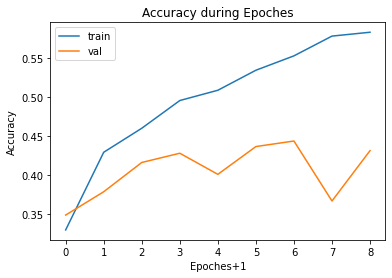

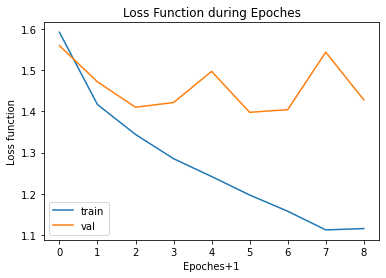

In [ ]:
####### Convolutional Network con EarlyStopping
NN_name = "Short"
image_size = 32
channels = 3
batch_size = 64
train_dataset, val_dataset, test_dataset = create_datasets(TRAINDIR, VALDIR, TESTDIR, image_size, batch_size)

img_rows = image_size
img_cols = image_size
kernel_size = 3 # Size of the kernel for the convolution layers
pool_size = 2 # Size of the pooling region for the pooling layers
NN_model = 'C32,3+P2+F+D6'
NN_ActivationFunction = 'softmax'
convnet = Sequential()
convnet.add(Rescaling(scale=1./255, input_shape=(image_size, image_size, channels))) # Input_shape Size = image rows x image columns x channels
convnet.add(Convolution2D(
    32, # Number convolution channels to generate
    (kernel_size, kernel_size), # Size of convolution kernels
    padding='valid', # Strategy to deal with borders
    input_shape=(img_rows, img_cols, channels), # Size = image rows x image columns x channels
    activation="relu"  # Activation function after the convolution
)) 
convnet.add(MaxPooling2D(pool_size=(pool_size, pool_size)))
convnet.add(Flatten())
convnet.add(Dense(6, activation=NN_ActivationFunction))

convnet.summary()

NN_optimizer = 'adam'
convnet.compile(loss='categorical_crossentropy', optimizer=NN_optimizer, metrics=["accuracy"])

# patient early stopping
NN_TrainingStrategy = 'Train from scratch & EarlyStopping'
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=3)
mc = ModelCheckpoint('best_model.h5', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
NN_epochs = 20
history = convnet.fit(train_dataset, validation_data=(val_dataset), batch_size=batch_size, epochs=NN_epochs, verbose=2, callbacks=[es, mc])

convnet_saved_model = load_model('best_model.h5')

score = convnet_saved_model.evaluate(test_dataset)
print(f"Image size:  {image_size}x{image_size} - Batches:  {batch_size}")
print(f"Model:  {NN_name} -> {NN_model}")
print(f"Training Strategy:  {NN_TrainingStrategy}")
print(f"Epoches:  {len(history.history['accuracy'])}/{NN_epochs}")
print(f"Test loss:  {score[0]:.3}")
print(f"Test accuracy:  {score[1]:.1%}")
results_table.loc[len(results_table)+1] = [NN_name, (f"{image_size}x{image_size}"), batch_size, NN_model, NN_ActivationFunction, NN_optimizer, NN_TrainingStrategy, \
                                           (f"{len(history.history['accuracy'])}/{NN_epochs}"), (f"{score[1]:.1%}")]

# plot training history
pyplot.plot(history.history['accuracy'], label='train')
pyplot.plot(history.history['val_accuracy'], label='val')
pyplot.legend()
pyplot.title('Accuracy during Epoches')
pyplot.xlabel("Epoches+1")
pyplot.ylabel("Accuracy")
pyplot.show()

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='val')
pyplot.legend()
pyplot.title('Loss Function during Epoches')
pyplot.xlabel("Epoches+1")
pyplot.ylabel("Loss function")
pyplot.show()

With "EarlyStopping" we don't need no longer to do 20 epoches otherwise that with a few we already achieve the same accuracy.
Therefore, we have managed to optimize the training process, shortening it in time and achieving the same accuracy.

We have gotten over the accuracy of the previous simple neural netwosrk with a convolutional neural network, also simple.      
But also we have realized we are getting overfitting since the train accuracy is higher the the validation on. To avoid it we will use the Dropout technique.

Let's go further and try to improve with a conolutional neural network with more hidden layers.

### 1.3 Large Convolutional Neural Network

Found 6082 files belonging to 6 classes.
Found 2108 files belonging to 6 classes.
Found 2070 files belonging to 6 classes.
Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling_5 (Rescaling)      (None, 32, 32, 3)         0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 30, 30, 32)        896       
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 28, 28, 32)        9248      
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 14, 14, 32)        0         
_________________________________________________________________
flatten_5 (Flatten)          (None, 6272)              0         
_________________________________________________________________
dense_5 (Dense)              (None, 128)               802944  

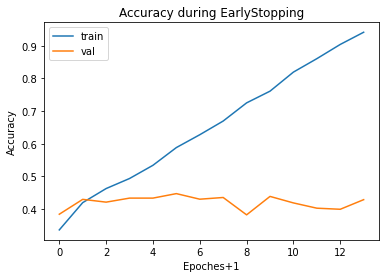

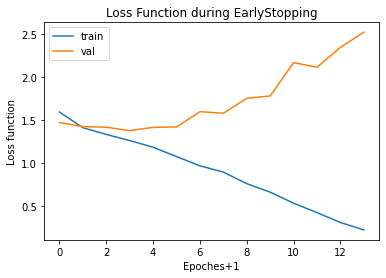

In [ ]:
####### Large Convolutional Network
NN_name = "Large"
image_size = 32
channels = 3
batch_size = 64
train_dataset, val_dataset, test_dataset = create_datasets(TRAINDIR, VALDIR, TESTDIR, image_size, batch_size)

img_rows = image_size
img_cols = image_size
kernel_size = 3 # Size of the kernel for the convolution layers
pool_size = 2 # Size of the pooling region for the pooling layers
NN_model = 'C32,3+C32,3+P2+D128+F+D6'
NN_ActivationFunction = 'softmax'

large_convnet = Sequential()
large_convnet.add(Rescaling(scale=1./255, input_shape=(image_size, image_size, channels))) # Input_shape Size = image rows x image columns x channels
large_convnet.add(Convolution2D(32, # Number convolution channels to generate
                        (kernel_size, kernel_size),
                        padding='valid',
                        input_shape=(img_rows, img_cols, channels),
                        activation="relu"))
large_convnet.add(Convolution2D(32, (kernel_size, kernel_size), activation="relu"))
large_convnet.add(MaxPooling2D(pool_size=(pool_size, pool_size)))
large_convnet.add(Flatten())
large_convnet.add(Dense(128, activation="relu"))
large_convnet.add(Dropout(0.0)) #Sin dropout
large_convnet.add(Dense(6, activation=NN_ActivationFunction))

large_convnet.summary()

NN_optimizer = 'adam'
large_convnet.compile(loss='categorical_crossentropy', optimizer=NN_optimizer, metrics=["accuracy"])

# patient early stopping
NN_TrainingStrategy = 'Train from scratch & EarlyStopping'
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
mc = ModelCheckpoint('best_model.h5', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
NN_epochs = 50
history = large_convnet.fit(train_dataset, validation_data=(val_dataset), batch_size=batch_size, epochs=NN_epochs, verbose=2, callbacks=[es, mc])

large_convnet_saved_model = load_model('best_model.h5')

score = large_convnet_saved_model.evaluate(test_dataset)
print(f"Image size:  {image_size}x{image_size} - Batches:  {batch_size}")
print(f"Model:  {NN_name} -> {NN_model}")
print(f"Training Strategy:  {NN_TrainingStrategy}")
print(f"Epoches:  {len(history.history['accuracy'])}/{NN_epochs}")
print(f"Test loss:  {score[0]:.3}")
print(f"Test accuracy:  {score[1]:.1%}")
results_table.loc[len(results_table)+1] = [NN_name, (f"{image_size}x{image_size}"), batch_size, NN_model, NN_ActivationFunction, NN_optimizer, NN_TrainingStrategy, \
                                           (f"{len(history.history['accuracy'])}/{NN_epochs}"), (f"{score[1]:.1%}")]

# plot training history
pyplot.plot(history.history['accuracy'], label='train')
pyplot.plot(history.history['val_accuracy'], label='val')
pyplot.legend()
pyplot.title('Accuracy during EarlyStopping')
pyplot.xlabel("Epoches+1")
pyplot.ylabel("Accuracy")
pyplot.show()

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='val')
pyplot.legend()
pyplot.title('Loss Function during EarlyStopping')
pyplot.xlabel("Epoches+1")
pyplot.ylabel("Loss function")
pyplot.show()

Found 6082 files belonging to 6 classes.
Found 2108 files belonging to 6 classes.
Found 2070 files belonging to 6 classes.
Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling_6 (Rescaling)      (None, 32, 32, 3)         0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 30, 30, 32)        896       
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 28, 28, 32)        9248      
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 14, 14, 32)        0         
_________________________________________________________________
flatten_6 (Flatten)          (None, 6272)              0         
_________________________________________________________________
dense_7 (Dense)              (None, 128)               802944  

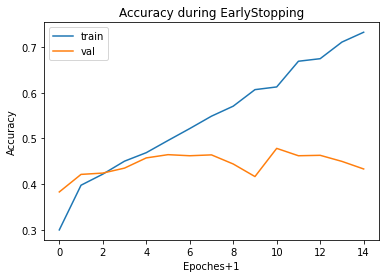

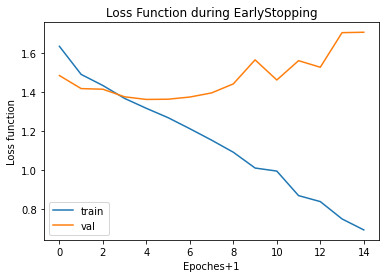

In [ ]:
####### Large Convolutional Network with Dropout
NN_name = "Large"
image_size = 32
channels = 3
batch_size = 64
train_dataset, val_dataset, test_dataset = create_datasets(TRAINDIR, VALDIR, TESTDIR, image_size, batch_size)

img_rows = image_size
img_cols = image_size
kernel_size = 3 # Size of the kernel for the convolution layers
pool_size = 2 # Size of the pooling region for the pooling layers
NN_model = 'C32,3+C32,3+P2+F+D128+d5+D6'
NN_ActivationFunction = 'softmax'

large_convnet_dropout = Sequential()

large_convnet_dropout.add(Rescaling(scale=1./255, input_shape=(image_size, image_size, channels))) # Input_shape Size = image rows x image columns x channels
large_convnet_dropout.add(Convolution2D(32, # Number convolution channels to generate
                        (kernel_size, kernel_size),
                        padding='valid',
                        input_shape=(img_rows, img_cols, channels),
                        activation="relu"))
large_convnet_dropout.add(Convolution2D(32, (kernel_size, kernel_size), activation="relu"))
large_convnet_dropout.add(MaxPooling2D(pool_size=(pool_size, pool_size)))
large_convnet_dropout.add(Flatten())
large_convnet_dropout.add(Dense(128, activation="relu"))
large_convnet_dropout.add(Dropout(0.5))
large_convnet_dropout.add(Dense(6, activation=NN_ActivationFunction))

large_convnet_dropout.summary()

NN_optimizer = 'adam'
large_convnet_dropout.compile(loss='categorical_crossentropy', optimizer=NN_optimizer, metrics=["accuracy"])

# patient early stopping
NN_TrainingStrategy = 'Train from scratch & EarlyStopping & Dropout'
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
mc = ModelCheckpoint('best_model.h5', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
NN_epochs = 50
history = large_convnet_dropout.fit(train_dataset, validation_data=(val_dataset), batch_size=batch_size, epochs=NN_epochs, verbose=2, callbacks=[es, mc])

large_convnet_dropout_saved_model = load_model('best_model.h5')

score = large_convnet_dropout_saved_model.evaluate(test_dataset)
print(f"Image size:  {image_size}x{image_size} - Batches:  {batch_size}")
print(f"Model:  {NN_name} -> {NN_model}")
print(f"Training Strategy:  {NN_TrainingStrategy}")
print(f"Epoches:  {len(history.history['accuracy'])}/{NN_epochs}")
print(f"Test loss:  {score[0]:.3}")
print(f"Test accuracy:  {score[1]:.1%}")
results_table.loc[len(results_table)+1] = [NN_name, (f"{image_size}x{image_size}"), batch_size, NN_model, NN_ActivationFunction, NN_optimizer, NN_TrainingStrategy, \
                                           (f"{len(history.history['accuracy'])}/{NN_epochs}"), (f"{score[1]:.1%}")]

# plot training history
pyplot.plot(history.history['accuracy'], label='train')
pyplot.plot(history.history['val_accuracy'], label='val')
pyplot.legend()
pyplot.title('Accuracy during EarlyStopping')
pyplot.xlabel("Epoches+1")
pyplot.ylabel("Accuracy")
pyplot.show()

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='val')
pyplot.legend()
pyplot.title('Loss Function during EarlyStopping')
pyplot.xlabel("Epoches+1")
pyplot.ylabel("Loss function")
pyplot.show()

Found 6082 files belonging to 6 classes.
Found 2108 files belonging to 6 classes.
Found 2070 files belonging to 6 classes.
Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling_7 (Rescaling)      (None, 64, 64, 3)         0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 62, 62, 32)        896       
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 60, 60, 32)        9248      
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 30, 30, 32)        0         
_________________________________________________________________
flatten_7 (Flatten)          (None, 28800)             0         
_________________________________________________________________
dense_9 (Dense)              (None, 128)               3686528 

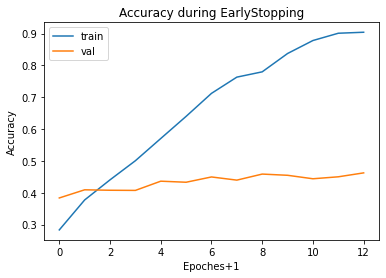

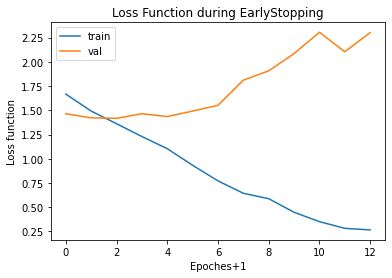

In [ ]:
####### Large Convolutional Network with Dropout
NN_name = "Large"
image_size = 64
channels = 3
batch_size = 64
train_dataset, val_dataset, test_dataset = create_datasets(TRAINDIR, VALDIR, TESTDIR, image_size, batch_size)

img_rows = image_size
img_cols = image_size
kernel_size = 3 # Size of the kernel for the convolution layers
pool_size = 2 # Size of the pooling region for the pooling layers
NN_model = 'C32,3+C32,3+P2+F+D128+d5+D6'
NN_ActivationFunction = 'softmax'

large_convnet_dropout = Sequential()

large_convnet_dropout.add(Rescaling(scale=1./255, input_shape=(image_size, image_size, channels))) # Input_shape Size = image rows x image columns x channels
large_convnet_dropout.add(Convolution2D(32, # Number convolution channels to generate
                        (kernel_size, kernel_size),
                        padding='valid',
                        input_shape=(img_rows, img_cols, channels),
                        activation="relu"))
large_convnet_dropout.add(Convolution2D(32, (kernel_size, kernel_size), activation="relu"))
large_convnet_dropout.add(MaxPooling2D(pool_size=(pool_size, pool_size)))
large_convnet_dropout.add(Flatten())
large_convnet_dropout.add(Dense(128, activation="relu"))
large_convnet_dropout.add(Dropout(0.5))
large_convnet_dropout.add(Dense(6, activation=NN_ActivationFunction))

large_convnet_dropout.summary()

NN_optimizer = 'adam'
large_convnet_dropout.compile(loss='categorical_crossentropy', optimizer=NN_optimizer, metrics=["accuracy"])

# patient early stopping
NN_TrainingStrategy = 'Train from scratch & EarlyStopping & Dropout'
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
mc = ModelCheckpoint('best_model.h5', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
NN_epochs = 50
history = large_convnet_dropout.fit(train_dataset, validation_data=(val_dataset), batch_size=batch_size, epochs=NN_epochs, verbose=2, callbacks=[es, mc])

large_convnet_dropout_saved_model = load_model('best_model.h5')

score = large_convnet_dropout_saved_model.evaluate(test_dataset)
print(f"Image size:  {image_size}x{image_size} - Batches:  {batch_size}")
print(f"Model:  {NN_name} -> {NN_model}")
print(f"Training Strategy:  {NN_TrainingStrategy}")
print(f"Epoches:  {len(history.history['accuracy'])}/{NN_epochs}")
print(f"Test loss:  {score[0]:.3}")
print(f"Test accuracy:  {score[1]:.1%}")
results_table.loc[len(results_table)+1] = [NN_name, (f"{image_size}x{image_size}"), batch_size, NN_model, NN_ActivationFunction, NN_optimizer, NN_TrainingStrategy, \
                                           (f"{len(history.history['accuracy'])}/{NN_epochs}"), (f"{score[1]:.1%}")]

# plot training history
pyplot.plot(history.history['accuracy'], label='train')
pyplot.plot(history.history['val_accuracy'], label='val')
pyplot.legend()
pyplot.title('Accuracy during EarlyStopping')
pyplot.xlabel("Epoches+1")
pyplot.ylabel("Accuracy")
pyplot.show()

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='val')
pyplot.legend()
pyplot.title('Loss Function during EarlyStopping')
pyplot.xlabel("Epoches+1")
pyplot.ylabel("Loss function")
pyplot.show()

### 1.4 Superlarge Convolutional Neural Network

Found 6082 files belonging to 6 classes.
Found 2108 files belonging to 6 classes.
Found 2070 files belonging to 6 classes.
Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling_8 (Rescaling)      (None, 128, 128, 3)       0         
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 126, 126, 32)      896       
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 42, 42, 32)        0         
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 40, 40, 32)        9248      
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 20, 20, 32)        0         
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 18, 18, 32)        9248    

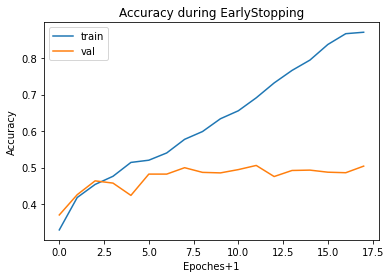

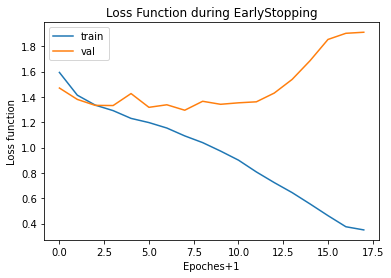

In [ ]:
###### Superlarge Convolutional Network without Dropout
NN_name = "Superlarge"
image_size = 128
channels = 3
batch_size = 128
train_dataset, val_dataset, test_dataset = create_datasets(TRAINDIR, VALDIR, TESTDIR, image_size, batch_size)

img_rows = image_size
img_cols = image_size
kernel_size = 3 # Size of the kernel for the convolution layers
pool_size = 3 # Size of the pooling region for the pooling layers
pool_size2 = 2 # Size of the pooling region for the pooling layers
pool_size3 = 2 # Size of the pooling region for the pooling layers
NN_model = 'C32,3+P3+C32,3+P2+C32,3+P2+F+D128+D128+D6'
NN_ActivationFunction = 'softmax'

super_large_convnet = Sequential()

super_large_convnet.add(Rescaling(scale=1./255, input_shape=(image_size, image_size, channels))) # Input_shape Size = image rows x image columns x channels
super_large_convnet.add(Convolution2D(32, # Number convolution channels to generate
                        (kernel_size, kernel_size),
                        padding='valid',
                        input_shape=(img_rows, img_cols, channels),
                        activation="relu"))
super_large_convnet.add(MaxPooling2D(pool_size=(pool_size, pool_size)))
super_large_convnet.add(Convolution2D(32, (kernel_size, kernel_size), activation="relu"))
super_large_convnet.add(MaxPooling2D(pool_size=(pool_size2, pool_size2)))
super_large_convnet.add(Convolution2D(32, (kernel_size, kernel_size), activation="relu"))
super_large_convnet.add(MaxPooling2D(pool_size=(pool_size2, pool_size2)))
super_large_convnet.add(Flatten())
super_large_convnet.add(Dense(128, activation="relu"))
super_large_convnet.add(Dense(128, activation="relu"))
super_large_convnet.add(Dense(6, activation=NN_ActivationFunction))

super_large_convnet.summary()

NN_optimizer = 'adam'
super_large_convnet.compile(loss='categorical_crossentropy', optimizer=NN_optimizer, metrics=["accuracy"])

# patient early stopping
NN_TrainingStrategy = 'Train from scratch & EarlyStopping'
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
mc = ModelCheckpoint('best_model.h5', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
NN_epochs = 50
history = super_large_convnet.fit(train_dataset, validation_data=(val_dataset), batch_size=batch_size, epochs=NN_epochs, verbose=2, callbacks=[es, mc])

super_large_convnet_saved_model = load_model('best_model.h5')

score = super_large_convnet_saved_model.evaluate(test_dataset)
print(f"Image size:  {image_size}x{image_size} - Batches:  {batch_size}")
print(f"Model:  {NN_name} -> {NN_model}")
print(f"Training Strategy:  {NN_TrainingStrategy}")
print(f"Epoches:  {len(history.history['accuracy'])}/{NN_epochs}")
print(f"Test loss:  {score[0]:.3}")
print(f"Test accuracy:  {score[1]:.1%}")
results_table.loc[len(results_table)+1] = [NN_name, (f"{image_size}x{image_size}"), batch_size, NN_model, NN_ActivationFunction, NN_optimizer, NN_TrainingStrategy, \
                                           (f"{len(history.history['accuracy'])}/{NN_epochs}"), (f"{score[1]:.1%}")]

# plot training history
pyplot.plot(history.history['accuracy'], label='train')
pyplot.plot(history.history['val_accuracy'], label='val')
pyplot.legend()
pyplot.title('Accuracy during EarlyStopping')
pyplot.xlabel("Epoches+1")
pyplot.ylabel("Accuracy")
pyplot.show()

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='val')
pyplot.legend()
pyplot.title('Loss Function during EarlyStopping')
pyplot.xlabel("Epoches+1")
pyplot.ylabel("Loss function")
pyplot.show()

It's possible to see that there is overfitting as during the training the accuray reaches to 0,89 but just arrives to 0,53 for test. Let's use dropout:

Found 6082 files belonging to 6 classes.
Found 2108 files belonging to 6 classes.
Found 2070 files belonging to 6 classes.
Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling_9 (Rescaling)      (None, 128, 128, 3)       0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 126, 126, 32)      896       
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 42, 42, 32)        0         
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 40, 40, 32)        9248      
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 20, 20, 32)        0         
_________________________________________________________________
conv2d_16 (Conv2D)           (None, 18, 18, 32)        9248    

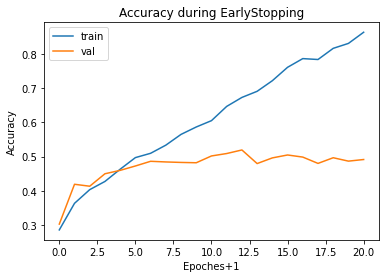

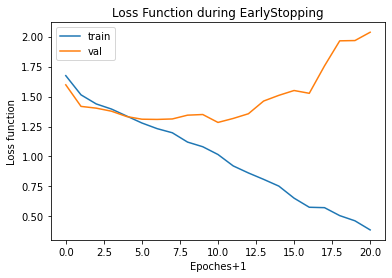

In [ ]:
###### Superlarge Convolutional Network with Dropout
NN_name = "Superlarge"
image_size = 128
channels = 3
batch_size = 128
train_dataset, val_dataset, test_dataset = create_datasets(TRAINDIR, VALDIR, TESTDIR, image_size, batch_size)

img_rows = image_size
img_cols = image_size
kernel_size = 3 # Size of the kernel for the convolution layers
pool_size = 3 # Size of the pooling region for the pooling layers
pool_size2 = 2 # Size of the pooling region for the pooling layers
pool_size3 = 2 # Size of the pooling region for the pooling layers
NN_model = 'C32,3+P3+C32,3+P2+C32,3+P2+F+D128+d25+D128+d25+D6'
NN_ActivationFunction = 'softmax'

super_large_convnet_dropout = Sequential()

super_large_convnet_dropout.add(Rescaling(scale=1./255, input_shape=(image_size, image_size, channels))) # Input_shape Size = image rows x image columns x channels
super_large_convnet_dropout.add(Convolution2D(32, # Number convolution channels to generate
                        (kernel_size, kernel_size),
                        padding='valid',
                        input_shape=(img_rows, img_cols, channels),
                        activation="relu"))
super_large_convnet_dropout.add(MaxPooling2D(pool_size=(pool_size, pool_size)))
super_large_convnet_dropout.add(Convolution2D(32, (kernel_size, kernel_size), activation="relu"))
super_large_convnet_dropout.add(MaxPooling2D(pool_size=(pool_size2, pool_size2)))
super_large_convnet_dropout.add(Convolution2D(32, (kernel_size, kernel_size), activation="relu"))
super_large_convnet_dropout.add(MaxPooling2D(pool_size=(pool_size2, pool_size2)))
super_large_convnet_dropout.add(Flatten())
super_large_convnet_dropout.add(Dense(128, activation="relu"))
super_large_convnet_dropout.add(Dropout(0.25))
super_large_convnet_dropout.add(Dense(128, activation="relu"))
super_large_convnet_dropout.add(Dropout(0.25))
super_large_convnet_dropout.add(Dense(6, activation=NN_ActivationFunction))

super_large_convnet_dropout.summary()

NN_optimizer = 'adam'
super_large_convnet_dropout.compile(loss='categorical_crossentropy', optimizer=NN_optimizer, metrics=["accuracy"])

# patient early stopping
NN_TrainingStrategy = 'Train from scratch & EarlyStopping & Dropout'
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
mc = ModelCheckpoint('best_model.h5', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
NN_epochs = 50
history = super_large_convnet_dropout.fit(train_dataset, validation_data=(val_dataset), batch_size=batch_size, epochs=NN_epochs, verbose=2, callbacks=[es, mc])

super_large_convnet_dropout_saved_model = load_model('best_model.h5')

score = super_large_convnet_dropout_saved_model.evaluate(test_dataset)
print(f"Image size:  {image_size}x{image_size} - Batches:  {batch_size}")
print(f"Model:  {NN_name} -> {NN_model}")
print(f"Training Strategy:  {NN_TrainingStrategy}")
print(f"Epoches:  {len(history.history['accuracy'])}/{NN_epochs}")
print(f"Test loss:  {score[0]:.3}")
print(f"Test accuracy:  {score[1]:.1%}")
results_table.loc[len(results_table)+1] = [NN_name, (f"{image_size}x{image_size}"), batch_size, NN_model, NN_ActivationFunction, NN_optimizer, NN_TrainingStrategy, \
                                           (f"{len(history.history['accuracy'])}/{NN_epochs}"), (f"{score[1]:.1%}")]

# plot training history
pyplot.plot(history.history['accuracy'], label='train')
pyplot.plot(history.history['val_accuracy'], label='val')
pyplot.legend()
pyplot.title('Accuracy during EarlyStopping')
pyplot.xlabel("Epoches+1")
pyplot.ylabel("Accuracy")
pyplot.show()

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='val')
pyplot.legend()
pyplot.title('Loss Function during EarlyStopping')
pyplot.xlabel("Epoches+1")
pyplot.ylabel("Loss function")
pyplot.show()

The ovverfittng has reduced but it's important still. We will try to decrease it with a hihger dropout and so arriving to 50% of the neurones enabled and the other 50% disabled.

Found 6082 files belonging to 6 classes.
Found 2108 files belonging to 6 classes.
Found 2070 files belonging to 6 classes.
Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling_10 (Rescaling)     (None, 128, 128, 3)       0         
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 126, 126, 32)      896       
_________________________________________________________________
max_pooling2d_12 (MaxPooling (None, 42, 42, 32)        0         
_________________________________________________________________
conv2d_18 (Conv2D)           (None, 40, 40, 32)        9248      
_________________________________________________________________
max_pooling2d_13 (MaxPooling (None, 20, 20, 32)        0         
_________________________________________________________________
conv2d_19 (Conv2D)           (None, 18, 18, 32)        9248   

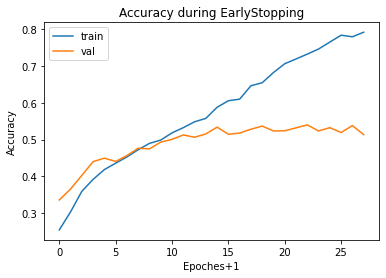

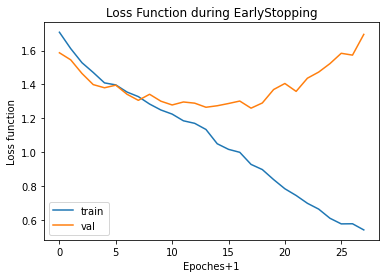

In [ ]:
###### Superlarge Convolutional Network with Dropout
NN_name = "Superlarge"
image_size = 128
channels = 3
batch_size = 128
train_dataset, val_dataset, test_dataset = create_datasets(TRAINDIR, VALDIR, TESTDIR, image_size, batch_size)

img_rows = image_size
img_cols = image_size
kernel_size = 3 # Size of the kernel for the convolution layers
pool_size = 3 # Size of the pooling region for the pooling layers
pool_size2 = 2 # Size of the pooling region for the pooling layers
pool_size3 = 2 # Size of the pooling region for the pooling layers
NN_model = 'C32,3+P3+C32,3+P2+C32,3+P2+F+D128+d5+D128+d5+D6'
NN_ActivationFunction = 'softmax'

super_large_convnet_dropout = Sequential()

super_large_convnet_dropout.add(Rescaling(scale=1./255, input_shape=(image_size, image_size, channels))) # Input_shape Size = image rows x image columns x channels
super_large_convnet_dropout.add(Convolution2D(32, # Number convolution channels to generate
                        (kernel_size, kernel_size),
                        padding='valid',
                        input_shape=(img_rows, img_cols, channels),
                        activation="relu"))
super_large_convnet_dropout.add(MaxPooling2D(pool_size=(pool_size, pool_size)))
super_large_convnet_dropout.add(Convolution2D(32, (kernel_size, kernel_size), activation="relu"))
super_large_convnet_dropout.add(MaxPooling2D(pool_size=(pool_size2, pool_size2)))
super_large_convnet_dropout.add(Convolution2D(32, (kernel_size, kernel_size), activation="relu"))
super_large_convnet_dropout.add(MaxPooling2D(pool_size=(pool_size2, pool_size2)))
super_large_convnet_dropout.add(Flatten())
super_large_convnet_dropout.add(Dense(128, activation="relu"))
super_large_convnet_dropout.add(Dropout(0.5))
super_large_convnet_dropout.add(Dense(128, activation="relu"))
super_large_convnet_dropout.add(Dropout(0.5))
super_large_convnet_dropout.add(Dense(6, activation=NN_ActivationFunction))

super_large_convnet_dropout.summary()

NN_optimizer = 'adam'
super_large_convnet_dropout.compile(loss='categorical_crossentropy', optimizer=NN_optimizer, metrics=["accuracy"])

# patient early stopping
NN_TrainingStrategy = 'Train from scratch & EarlyStopping & Dropout'
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
mc = ModelCheckpoint('best_model.h5', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
NN_epochs = 50
history = super_large_convnet_dropout.fit(train_dataset, validation_data=(val_dataset), batch_size=batch_size, epochs=NN_epochs, verbose=2, callbacks=[es, mc])

super_large_convnet_dropout_saved_model = load_model('best_model.h5')

score = super_large_convnet_dropout_saved_model.evaluate(test_dataset)
print(f"Image size:  {image_size}x{image_size} - Batches:  {batch_size}")
print(f"Model:  {NN_name} -> {NN_model}")
print(f"Training Strategy:  {NN_TrainingStrategy}")
print(f"Epoches:  {len(history.history['accuracy'])}/{NN_epochs}")
print(f"Test loss:  {score[0]:.3}")
print(f"Test accuracy:  {score[1]:.1%}")
results_table.loc[len(results_table)+1] = [NN_name, (f"{image_size}x{image_size}"), batch_size, NN_model, NN_ActivationFunction, NN_optimizer, NN_TrainingStrategy, \
                                           (f"{len(history.history['accuracy'])}/{NN_epochs}"), (f"{score[1]:.1%}")]

# plot training history
pyplot.plot(history.history['accuracy'], label='train')
pyplot.plot(history.history['val_accuracy'], label='val')
pyplot.legend()
pyplot.title('Accuracy during EarlyStopping')
pyplot.xlabel("Epoches+1")
pyplot.ylabel("Accuracy")
pyplot.show()

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='val')
pyplot.legend()
pyplot.title('Loss Function during EarlyStopping')
pyplot.xlabel("Epoches+1")
pyplot.ylabel("Loss function")
pyplot.show()

### 1.5 Red Convolucional LeNet

Found 6082 files belonging to 6 classes.
Found 2108 files belonging to 6 classes.
Found 2070 files belonging to 6 classes.
Model: "sequential_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling_11 (Rescaling)     (None, 32, 32, 3)         0         
_________________________________________________________________
conv2d_20 (Conv2D)           (None, 28, 28, 32)        2432      
_________________________________________________________________
max_pooling2d_15 (MaxPooling (None, 14, 14, 32)        0         
_________________________________________________________________
conv2d_21 (Conv2D)           (None, 10, 10, 50)        40050     
_________________________________________________________________
max_pooling2d_16 (MaxPooling (None, 5, 5, 50)          0         
_________________________________________________________________
flatten_11 (Flatten)         (None, 1250)              0      

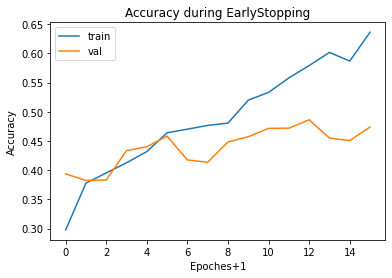

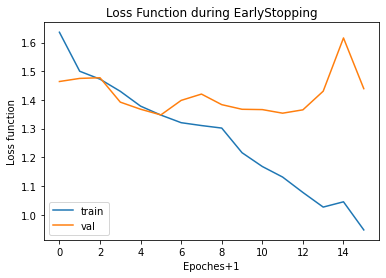

In [ ]:
####### LeNet
NN_name = "LeNet"
image_size = 32
channels = 3
batch_size = 64
train_dataset, val_dataset, test_dataset = create_datasets(TRAINDIR, VALDIR, TESTDIR, image_size, batch_size)

img_rows = image_size
img_cols = image_size
kernel_size = 5 # Size of the kernel for the convolution layers
pool_size = 2 # Size of the pooling region for the pooling layers
NN_model = 'C32,5+P2+C50,5+P2+F+D256+d5+D6'
NN_ActivationFunction = 'softmax'

lenet = Sequential()

lenet.add(Rescaling(scale=1./255, input_shape=(image_size, image_size, channels))) # Input_shape Size = image rows x image columns x channels
lenet.add(Convolution2D(
    32,
    (kernel_size, kernel_size),
    padding='valid',
    input_shape=(img_rows, img_cols, channels),
    activation="relu"
))
lenet.add(MaxPooling2D(pool_size=2, strides=2))
lenet.add(Convolution2D(50, (kernel_size, kernel_size), activation="relu"))
lenet.add(MaxPooling2D(pool_size=2, strides=2))
lenet.add(Flatten())
lenet.add(Dense(256, activation="relu"))
lenet.add(Dropout(0.5))
lenet.add(Dense(6, activation=NN_ActivationFunction))

lenet.summary()

NN_optimizer = 'adam'
lenet.compile(loss='categorical_crossentropy', optimizer=NN_optimizer, metrics=["accuracy"])

# patient early stopping
NN_TrainingStrategy = 'Train from scratch & EarlyStopping & Dropout'
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
mc = ModelCheckpoint('best_model.h5', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
NN_epochs = 50
history = lenet.fit(train_dataset, validation_data=(val_dataset), batch_size=128, epochs=NN_epochs, verbose=2, callbacks=[es, mc])

lenet_saved_model = load_model('best_model.h5')

score = lenet_saved_model.evaluate(test_dataset)
print(f"Image size:  {image_size}x{image_size} - Batches:  {batch_size}")
print(f"Model:  {NN_name} -> {NN_model}")
print(f"Training Strategy:  {NN_TrainingStrategy}")
print(f"Epoches:  {len(history.history['accuracy'])}/{NN_epochs}")
print(f"Test loss:  {score[0]:.3}")
print(f"Test accuracy:  {score[1]:.1%}")
results_table.loc[len(results_table)+1] = [NN_name, (f"{image_size}x{image_size}"), batch_size, NN_model, NN_ActivationFunction, NN_optimizer, NN_TrainingStrategy, \
                                           (f"{len(history.history['accuracy'])}/{NN_epochs}"), (f"{score[1]:.1%}")]

# plot training history
pyplot.plot(history.history['accuracy'], label='train')
pyplot.plot(history.history['val_accuracy'], label='val')
pyplot.legend()
pyplot.title('Accuracy during EarlyStopping')
pyplot.xlabel("Epoches+1")
pyplot.ylabel("Accuracy")
pyplot.show()

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='val')
pyplot.legend()
pyplot.title('Loss Function during EarlyStopping')
pyplot.xlabel("Epoches+1")
pyplot.ylabel("Loss function")
pyplot.show()

Found 6082 files belonging to 6 classes.
Found 2108 files belonging to 6 classes.
Found 2070 files belonging to 6 classes.
Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling_12 (Rescaling)     (None, 64, 64, 3)         0         
_________________________________________________________________
conv2d_22 (Conv2D)           (None, 60, 60, 32)        2432      
_________________________________________________________________
max_pooling2d_17 (MaxPooling (None, 30, 30, 32)        0         
_________________________________________________________________
conv2d_23 (Conv2D)           (None, 26, 26, 50)        40050     
_________________________________________________________________
max_pooling2d_18 (MaxPooling (None, 13, 13, 50)        0         
_________________________________________________________________
flatten_12 (Flatten)         (None, 8450)              0      

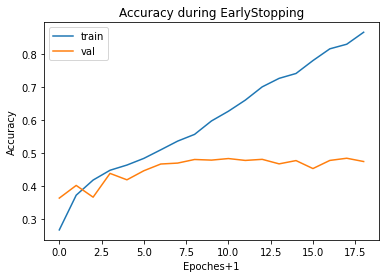

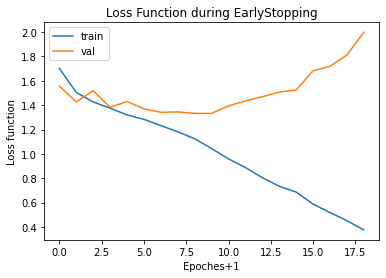

In [ ]:
####### LeNet
NN_name = "LeNet"
image_size = 64
channels = 3
batch_size = 128
train_dataset, val_dataset, test_dataset = create_datasets(TRAINDIR, VALDIR, TESTDIR, image_size, batch_size)

img_rows = image_size
img_cols = image_size
kernel_size = 5 # Size of the kernel for the convolution layers
pool_size = 2 # Size of the pooling region for the pooling layers
NN_model = 'C32,5+P2+C50,5+P2+F+D256+Do5+D6'
NN_ActivationFunction = 'softmax'

lenet = Sequential()

lenet.add(Rescaling(scale=1./255, input_shape=(image_size, image_size, channels))) # Input_shape Size = image rows x image columns x channels
lenet.add(Convolution2D(
    32,
    (kernel_size, kernel_size),
    padding='valid',
    input_shape=(img_rows, img_cols, channels),
    activation="relu"
))
lenet.add(MaxPooling2D(pool_size=2, strides=2))
lenet.add(Convolution2D(50, (kernel_size, kernel_size), activation="relu"))
lenet.add(MaxPooling2D(pool_size=2, strides=2))
lenet.add(Flatten())
lenet.add(Dense(256, activation="relu"))
lenet.add(Dropout(0.5))
lenet.add(Dense(6, activation=NN_ActivationFunction))

lenet.summary()

NN_optimizer = 'adam'
lenet.compile(loss='categorical_crossentropy', optimizer=NN_optimizer, metrics=["accuracy"])

# patient early stopping
NN_TrainingStrategy = 'Train from scratch & EarlyStopping & Dropout'
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
mc = ModelCheckpoint('best_model.h5', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
NN_epochs = 50
history = lenet.fit(train_dataset, validation_data=(val_dataset), batch_size=batch_size, epochs=NN_epochs, verbose=2, callbacks=[es, mc])

lenet_saved_model = load_model('best_model.h5')

score = lenet_saved_model.evaluate(test_dataset)
print(f"Image size:  {image_size}x{image_size} - Batches:  {batch_size}")
print(f"Model:  {NN_name} -> {NN_model}")
print(f"Training Strategy:  {NN_TrainingStrategy}")
print(f"Epoches:  {len(history.history['accuracy'])}/{NN_epochs}")
print(f"Test loss:  {score[0]:.3}")
print(f"Test accuracy:  {score[1]:.1%}")
results_table.loc[len(results_table)+1] = [NN_name, (f"{image_size}x{image_size}"), batch_size, NN_model, NN_ActivationFunction, NN_optimizer, NN_TrainingStrategy, \
                                           (f"{len(history.history['accuracy'])}/{NN_epochs}"), (f"{score[1]:.1%}")]
# plot training history
pyplot.plot(history.history['accuracy'], label='train')
pyplot.plot(history.history['val_accuracy'], label='val')
pyplot.legend()
pyplot.title('Accuracy during EarlyStopping')
pyplot.xlabel("Epoches+1")
pyplot.ylabel("Accuracy")
pyplot.show()

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='val')
pyplot.legend()
pyplot.title('Loss Function during EarlyStopping')
pyplot.xlabel("Epoches+1")
pyplot.ylabel("Loss function")
pyplot.show()

### 1.6 Image augmentation techniques


<font>
    
Other advanced strategies we can try are:

- Use **image augmentation techniques** to artifically create new training images. To do so, we will explore the rest of layers available in the <a href="https://keras.io/api/layers/preprocessing_layers/image_preprocessing/">Keras Image Preprocessing module</a>.
- Use <a href="https://keras.io/api/layers/normalization_layers/batch_normalization/">BatchNormalization</a> layers to improve the optimization procedure.
    
It we use all the tricks, it is possible to obtain more than 60% accuracy in the test set.

</font>


In [14]:
import tensorflow_datasets as tfds
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import BatchNormalization
#from keras.layers import BatchNormalization
from tensorflow.keras.initializers import RandomNormal, Constant

In [15]:
def create_datasets_aug(trainDir, valDir, testDir, image_size, batch_size):
  image_size = image_size
  batch_size = batch_size

  train_datagen = ImageDataGenerator(
    #rescale=1./255, 
    featurewise_center=True, 
    featurewise_std_normalization=True, 
    rotation_range=20, width_shift_range=0.2,
    height_shift_range=0.2, horizontal_flip=True)

  train_dataset = train_datagen.flow_from_directory(
      trainDir, 
      target_size=(image_size,image_size),
      batch_size=batch_size,
      class_mode='categorical'
  )
  val_dataset = image_dataset_from_directory(
      valDir, 
      image_size = (image_size, image_size),
      batch_size = batch_size, 
      label_mode = 'categorical'
  )
  test_dataset = image_dataset_from_directory(
      testDir, 
      image_size = (image_size, image_size),
      batch_size = batch_size, 
      label_mode = 'categorical'
  )
  return train_dataset, val_dataset, test_dataset

Found 6082 images belonging to 6 classes.
Found 2108 files belonging to 6 classes.
Found 2070 files belonging to 6 classes.
Model: "sequential_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling_13 (Rescaling)     (None, 128, 128, 3)       0         
_________________________________________________________________
conv2d_24 (Conv2D)           (None, 126, 126, 32)      896       
_________________________________________________________________
max_pooling2d_19 (MaxPooling (None, 42, 42, 32)        0         
_________________________________________________________________
conv2d_25 (Conv2D)           (None, 40, 40, 32)        9248      
_________________________________________________________________
max_pooling2d_20 (MaxPooling (None, 20, 20, 32)        0         
_________________________________________________________________
conv2d_26 (Conv2D)           (None, 18, 18, 32)        9248  

/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/image_data_generator.py:720: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '
/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/image_data_generator.py:728: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '


Epoch 1/50
47/47 - 134s - loss: 1.6673 - accuracy: 0.2715 - val_loss: 1.5452 - val_accuracy: 0.3548

Epoch 00001: val_accuracy improved from -inf to 0.35484, saving model to best_model.h5
Epoch 2/50
47/47 - 132s - loss: 1.5864 - accuracy: 0.3172 - val_loss: 1.5254 - val_accuracy: 0.3809

Epoch 00002: val_accuracy improved from 0.35484 to 0.38093, saving model to best_model.h5
Epoch 3/50
47/47 - 130s - loss: 1.5158 - accuracy: 0.3601 - val_loss: 1.4021 - val_accuracy: 0.4284

Epoch 00003: val_accuracy improved from 0.38093 to 0.42837, saving model to best_model.h5
Epoch 4/50
47/47 - 129s - loss: 1.4757 - accuracy: 0.3854 - val_loss: 1.4246 - val_accuracy: 0.4274

Epoch 00004: val_accuracy did not improve from 0.42837
Epoch 5/50
47/47 - 127s - loss: 1.4450 - accuracy: 0.4028 - val_loss: 1.3618 - val_accuracy: 0.4398

Epoch 00005: val_accuracy improved from 0.42837 to 0.43975, saving model to best_model.h5
Epoch 6/50
47/47 - 129s - loss: 1.4178 - accuracy: 0.4231 - val_loss: 1.3833 - val_

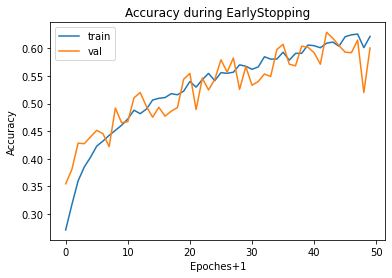

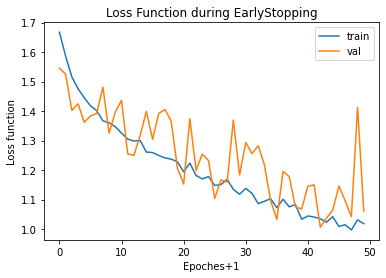

In [ ]:
NN_name = "Superlarge"
image_size = 128
channels = 3
batch_size = 128

train_dataset_aug, val_dataset_aug, test_dataset2 = create_datasets_aug(TRAINDIR, VALDIR, TESTDIR, image_size, batch_size)

img_rows = image_size
img_cols = image_size
kernel_size = 3 # Size of the kernel for the convolution layers
pool_size = 3 # Size of the pooling region for the pooling layers
pool_size2 = 2 # Size of the pooling region for the pooling layers
pool_size3 = 2 # Size of the pooling region for the pooling layers
NN_model = 'C32,3+P3+C32,3+P2+C32,3+P2+F+D128+d25+D128+d25+D6'
NN_ActivationFunction = 'softmax'

super_large_convnet_dropout = Sequential()

super_large_convnet_dropout.add(Rescaling(scale=1./255, input_shape=(image_size, image_size, channels))) # Input_shape Size = image rows x image columns x channels
super_large_convnet_dropout.add(Convolution2D(32, # Number convolution channels to generate
                        (kernel_size, kernel_size),
                        padding='valid',
                        input_shape=(img_rows, img_cols, channels),
                        activation="relu"))
super_large_convnet_dropout.add(MaxPooling2D(pool_size=(pool_size, pool_size)))
super_large_convnet_dropout.add(Convolution2D(32, (kernel_size, kernel_size), activation="relu"))
super_large_convnet_dropout.add(MaxPooling2D(pool_size=(pool_size2, pool_size2)))
super_large_convnet_dropout.add(Convolution2D(32, (kernel_size, kernel_size), activation="relu"))
super_large_convnet_dropout.add(MaxPooling2D(pool_size=(pool_size2, pool_size2)))
super_large_convnet_dropout.add(Flatten())
super_large_convnet_dropout.add(Dense(128, activation="relu"))
super_large_convnet_dropout.add(Dropout(0.25))
super_large_convnet_dropout.add(Dense(128, activation="relu"))
super_large_convnet_dropout.add(Dropout(0.25))
super_large_convnet_dropout.add(Dense(6, activation=NN_ActivationFunction))

super_large_convnet_dropout.summary()

NN_optimizer = 'adam'
super_large_convnet_dropout.compile(loss='categorical_crossentropy', optimizer=NN_optimizer, metrics=["accuracy"])

# patient early stopping
NN_TrainingStrategy = 'Train from scratch & Augmentation & EarlyStopping & Dropout'
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
mc = ModelCheckpoint('best_model.h5', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
NN_epochs = 50
history = super_large_convnet_dropout.fit(train_dataset_aug, validation_data=(val_dataset_aug), batch_size=batch_size, steps_per_epoch=6082/batch_size, epochs=NN_epochs, verbose=2, callbacks=[es, mc])

super_large_convnet_dropout_saved_model = load_model('best_model.h5')

score = super_large_convnet_dropout_saved_model.evaluate(test_dataset2)
print(f"Image size:  {image_size}x{image_size} - Batches:  {batch_size}")
print(f"Model:  {NN_name} -> {NN_model}")
print(f"Training Strategy:  {NN_TrainingStrategy}")
print(f"Epoches:  {len(history.history['accuracy'])}/{NN_epochs}")
print(f"Test loss:  {score[0]:.3}")
print(f"Test accuracy:  {score[1]:.1%}")
results_table.loc[len(results_table)+1] = [NN_name, (f"{image_size}x{image_size}"), batch_size, NN_model, NN_ActivationFunction, NN_optimizer, NN_TrainingStrategy,
                                           (f"{len(history.history['accuracy'])}/{NN_epochs}"), (f"{score[1]:.1%}")]

# plot training history
pyplot.plot(history.history['accuracy'], label='train')
pyplot.plot(history.history['val_accuracy'], label='val')
pyplot.legend()
pyplot.title('Accuracy during EarlyStopping')
pyplot.xlabel("Epoches+1")
pyplot.ylabel("Accuracy")
pyplot.show()

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='val')
pyplot.legend()
pyplot.title('Loss Function during EarlyStopping')
pyplot.xlabel("Epoches+1")
pyplot.ylabel("Loss function")
pyplot.show()

<b>Target reached!</b>

Probemos a añadir BartchNormalization (BN). Éste elimina la necesidad del Dropout, en algunos casos, BN proporciona beneficios de regularización similares como Dropout

Found 6082 images belonging to 6 classes.
Found 2108 files belonging to 6 classes.
Found 2070 files belonging to 6 classes.
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 128, 128, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 126, 126, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 42, 42, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 40, 40, 32)        9248      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 20, 20, 32)       0         
 2D)                                                            

/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/image_data_generator.py:720: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '
/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/image_data_generator.py:728: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '


Epoch 1/50

Epoch 1: val_accuracy improved from -inf to 0.29649, saving model to best_model.h5
47/47 - 75s - loss: 1.5765 - accuracy: 0.3392 - val_loss: 1.7171 - val_accuracy: 0.2965 - 75s/epoch - 2s/step
Epoch 2/50

Epoch 2: val_accuracy did not improve from 0.29649
47/47 - 76s - loss: 1.4499 - accuracy: 0.4078 - val_loss: 1.7198 - val_accuracy: 0.2495 - 76s/epoch - 2s/step
Epoch 3/50

Epoch 3: val_accuracy improved from 0.29649 to 0.33017, saving model to best_model.h5
47/47 - 94s - loss: 1.3967 - accuracy: 0.4378 - val_loss: 1.6972 - val_accuracy: 0.3302 - 94s/epoch - 2s/step
Epoch 4/50

Epoch 4: val_accuracy did not improve from 0.33017
47/47 - 79s - loss: 1.3385 - accuracy: 0.4720 - val_loss: 1.6771 - val_accuracy: 0.2538 - 79s/epoch - 2s/step
Epoch 5/50

Epoch 5: val_accuracy did not improve from 0.33017
47/47 - 83s - loss: 1.3139 - accuracy: 0.4790 - val_loss: 1.6600 - val_accuracy: 0.3050 - 83s/epoch - 2s/step
Epoch 6/50

Epoch 6: val_accuracy improved from 0.33017 to 0.40370, 

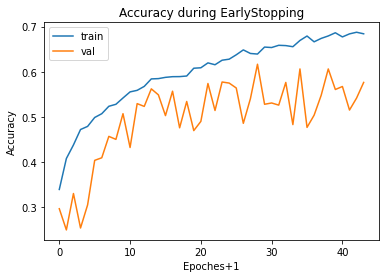

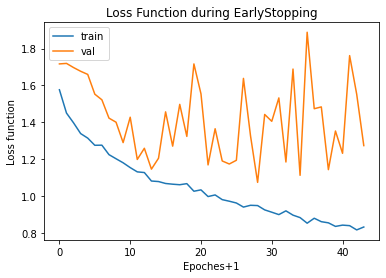

In [ ]:
NN_name = "Superlarge"
image_size = 128
channels = 3
batch_size = 128

train_dataset_aug, val_dataset_aug, test_dataset2 = create_datasets_aug(TRAINDIR, VALDIR, TESTDIR, image_size, batch_size)

img_rows = image_size
img_cols = image_size
kernel_size = 3 # Size of the kernel for the convolution layers
pool_size = 3 # Size of the pooling region for the pooling layers
pool_size2 = 2 # Size of the pooling region for the pooling layers
pool_size3 = 2 # Size of the pooling region for the pooling layers
NN_model = 'C32,3+P3+C32,3+P2+C32,3+BN+P2+F+D128+D128+D6'
NN_ActivationFunction = 'softmax'

super_large_convnet_batchnorm = Sequential()

super_large_convnet_batchnorm.add(Rescaling(scale=1./255, input_shape=(image_size, image_size, channels))) # Input_shape Size = image rows x image columns x channels
super_large_convnet_batchnorm.add(Convolution2D(32, # Number convolution channels to generate
                        (kernel_size, kernel_size),
                        padding='valid',
                        input_shape=(img_rows, img_cols, channels),
                        activation="relu"))
super_large_convnet_batchnorm.add(MaxPooling2D(pool_size=(pool_size, pool_size)))
super_large_convnet_batchnorm.add(Convolution2D(32, (kernel_size, kernel_size), activation="relu"))
super_large_convnet_batchnorm.add(MaxPooling2D(pool_size=(pool_size2, pool_size2)))
super_large_convnet_batchnorm.add(Convolution2D(32, (kernel_size, kernel_size), activation="relu"))
super_large_convnet_batchnorm.add(MaxPooling2D(pool_size=(pool_size2, pool_size2)))
super_large_convnet_batchnorm.add(BatchNormalization())
super_large_convnet_batchnorm.add(Flatten())
super_large_convnet_batchnorm.add(Dense(128))
super_large_convnet_batchnorm.add(Activation("relu"))
super_large_convnet_batchnorm.add(Dense(128))
super_large_convnet_batchnorm.add(Activation("relu"))
super_large_convnet_batchnorm.add(Dense(6, activation=NN_ActivationFunction))

super_large_convnet_batchnorm.summary()

NN_optimizer = 'adam'
super_large_convnet_batchnorm.compile(loss='categorical_crossentropy', optimizer=NN_optimizer, metrics=["accuracy"])

# patient early stopping
NN_TrainingStrategy = 'Train from scratch&Augmentation&EarlyStop&BN'
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=15)
mc = ModelCheckpoint('best_model.h5', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
NN_epochs = 50
history = super_large_convnet_batchnorm.fit(train_dataset_aug, validation_data=(val_dataset_aug), batch_size=batch_size, steps_per_epoch=6082/batch_size, epochs=NN_epochs, verbose=2, callbacks=[es, mc])

super_large_convnet_batchnorm_saved_model = load_model('best_model.h5')

score = super_large_convnet_batchnorm_saved_model.evaluate(test_dataset2)
print(f"Image size:  {image_size}x{image_size} - Batches:  {batch_size}")
print(f"Model:  {NN_name} -> {NN_model}")
print(f"Training Strategy:  {NN_TrainingStrategy}")
print(f"Epoches:  {len(history.history['accuracy'])}/{NN_epochs}")
print(f"Test loss:  {score[0]:.3}")
print(f"Test accuracy:  {score[1]:.1%}")
results_table.loc[len(results_table)+1] = [NN_name, (f"{image_size}x{image_size}"), batch_size, NN_model, NN_ActivationFunction, NN_optimizer, NN_TrainingStrategy,
                                           (f"{len(history.history['accuracy'])}/{NN_epochs}"), (f"{score[1]:.1%}")]

# plot training history
pyplot.plot(history.history['accuracy'], label='train')
pyplot.plot(history.history['val_accuracy'], label='val')
pyplot.legend()
pyplot.title('Accuracy during EarlyStopping')
pyplot.xlabel("Epoches+1")
pyplot.ylabel("Accuracy")
pyplot.show()

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='val')
pyplot.legend()
pyplot.title('Loss Function during EarlyStopping')
pyplot.xlabel("Epoches+1")
pyplot.ylabel("Loss function")
pyplot.show()

With Image Augmentatition and BatchNormalization we reach also the target over 60%.

## Transfer learning

<font>
    <b>Target: </b>Using the bottleneck strategy, implement a network doing transfer learning from VGG16 to obtain better results than with your previously designed network, at least a 80% of accuracy over the test set.
</font>

While designing our own network might produce some nice results, it is generally better to transfer the knowledge available in a pre-trained network. This not only can produce better results, but also saves a lot of design time. The [Keras Applications](https://keras.io/api/applications/) module contains several network designs ready to use. For instance, to exploit the famous VGG16 network we do

In [16]:
from tensorflow.keras.applications import VGG16
image_size = 128
vgg16_model = VGG16(include_top=False, input_shape=(image_size, image_size, 3))

58900480/58889256 [==============================] - 0s 0us/step


By default all Keras Applications networks are preloaded with the weights that were obtained from training the network over the [ImageNet dataset](http://www.image-net.org/). To adapt the network to our problem we need to specify the shape of our input images, and also remove the output layers (top) of the original network, since we have a different number of classes.

Now, how do we do transfer learning over this network? We will show here how to implement the bottleneck features strategy. First, we will mark the VGG16 model as **non-trainable**, so that the weights remain frozen

In [17]:
vgg16_model.trainable = False

Now we will build a neural network that includes the VGG16 model as one of its "layers". Since the VGG16 was trained with an specific way of normalizing the images, we will need to normalize our images in the same way. Conveniently, Keras also provides a function for doing VGG16-style normalization.

In [18]:
from keras.applications.vgg16 import preprocess_input

We can try this with some image ir our dataset

In [19]:
for X_batch, _ in train_dataset:
    break
    
print(f"Before normalizing: {X_batch[0, :3, :3, :]}")
print(f"After normalizing: {preprocess_input(X_batch)[0, :3, :3, :]}")

Before normalizing: [[[160.5  130.    74.25]
  [176.5  150.    66.  ]
  [148.5  115.    58.  ]]

 [[153.75 122.    68.5 ]
  [162.75 135.75  57.75]
  [113.    90.75  38.5 ]]

 [[152.5  122.    64.5 ]
  [157.5  136.    66.5 ]
  [ 80.75  40.     2.  ]]]
After normalizing: [[[ -29.689003    13.221001    36.82     ]
  [ -37.939003    33.221       52.82     ]
  [ -45.939003    -1.7789993   24.82     ]]

 [[ -35.439003     5.2210007   30.07     ]
  [ -46.189003    18.971       39.07     ]
  [ -65.439      -26.029      -10.68     ]]

 [[ -39.439003     5.2210007   28.82     ]
  [ -37.439003    19.221       33.82     ]
  [-101.939      -76.779      -42.93     ]]]


The normalization required by VGG16 involves swapping the order of color channels (RGB -> BGR) and substracting the mean values over the ImageNet dataset for each color channel separately. Fortunately the `preprocess_input` function does all the work for us. Furthermore, we can plug this function as the first layer of our network, similarly to the `Rescaling` we used before. We can do this with a `Lambda` layer, which allows building a layer out of any (differentiable!) function. Let's start our models.

In [20]:
import tensorflow.keras.layers

We will gradually apply hidden layers and the same techniques as in the previous problem to see how the performance of the network developes as more features are applied to it.  
First of all let's see what happens with smaller image sizes:

Model: "sequential_51"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lambda_43 (Lambda)           (None, 32, 32, 3)         0         
_________________________________________________________________
vgg16 (Functional)           (None, 1, 1, 512)         14714688  
_________________________________________________________________
flatten_54 (Flatten)         (None, 512)               0         
_________________________________________________________________
dense_67 (Dense)             (None, 6)                 3078      
Total params: 14,717,766
Trainable params: 3,078
Non-trainable params: 14,714,688
_________________________________________________________________
Epoch 1/50
96/96 - 14s - loss: 15.2897 - accuracy: 0.2890 - val_loss: 10.2224 - val_accuracy: 0.3752

Epoch 00001: val_accuracy improved from -inf to 0.37524, saving model to best_model.h5
Epoch 2/50
96/96 - 13s - loss: 8.3426 - accura

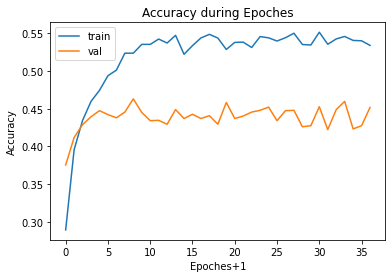

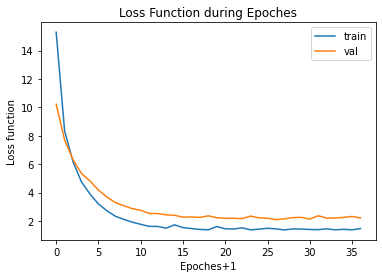

In [ ]:
NN_name = "VGG16+Custom"
image_size = 32
channels = 3
batch_size = 64
train_dataset, val_dataset, test_dataset = create_datasets(TRAINDIR, VALDIR, TESTDIR, image_size, batch_size)

NN_model = 'VGG16+F+D6'
NN_ActivationFunction = 'softmax'

model2 = Sequential()

model2.add(tensorflow.keras.layers.Lambda(preprocess_input, input_shape=(image_size, image_size, 3)))

model2.add(vgg16_model)
model2.add(Flatten())
model2.add(Dense(6, activation=NN_ActivationFunction))

model2.summary()

NN_optimizer = 'adam'
model2.compile(loss='categorical_crossentropy', optimizer=NN_optimizer, metrics=["accuracy"])

# patient early stopping
NN_TrainingStrategy = 'Bottleneck features & EarlyStopping'
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
mc = ModelCheckpoint('best_model.h5', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
NN_epochs = 50
history = model2.fit(train_dataset, validation_data=(val_dataset), batch_size=batch_size, epochs=NN_epochs, verbose=2, callbacks=[es, mc])

model2_saved_model = load_model('best_model.h5')

score = model2_saved_model.evaluate(test_dataset)
print(f"Image size:  {image_size}x{image_size} - Batches:  {batch_size}")
print(f"Model:  {NN_name} -> {NN_model}")
print(f"Training Strategy:  {NN_TrainingStrategy}")
print(f"Epoches:  {len(history.history['accuracy'])}/{NN_epochs}")
print(f"Test loss:  {score[0]:.3}")
print(f"Test accuracy:  {score[1]:.1%}")
results_table.loc[len(results_table)+1] = [NN_name, (f"{image_size}x{image_size}"), batch_size, NN_model, NN_ActivationFunction, NN_optimizer, NN_TrainingStrategy, \
                                           (f"{len(history.history['accuracy'])}/{NN_epochs}"), (f"{score[1]:.1%}")]

# plot training history
pyplot.plot(history.history['accuracy'], label='train')
pyplot.plot(history.history['val_accuracy'], label='val')
pyplot.legend()
pyplot.title('Accuracy during Epoches')
pyplot.xlabel("Epoches+1")
pyplot.ylabel("Accuracy")
pyplot.show()

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='val')
pyplot.legend()
pyplot.title('Loss Function during Epoches')
pyplot.xlabel("Epoches+1")
pyplot.ylabel("Loss function")
pyplot.show()

After this, we can add the whole VGG16 network as a layer, and our custom trainable layers after it.
Notice how in the model summary we can see the whole network has millions of parameters, but since we have frozen the VGG16 part, only a few thousand parameters will be trained: those in the Dense layer.

In the previous model we tested with image sizes of 32x32 to see what size arrives to the Flaten layer, as we can see it arrives image sizes of 1x1, so, a single pixel that's why the performance is so low. Therefore, we will go on with image sizes of 128x128 píxels.

Found 6082 images belonging to 6 classes.
Found 2108 files belonging to 6 classes.
Found 2070 files belonging to 6 classes.
Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lambda_1 (Lambda)           (None, 128, 128, 3)       0         
                                                                 
 vgg16 (Functional)          (None, 4, 4, 512)         14714688  
                                                                 
 flatten_2 (Flatten)         (None, 8192)              0         
                                                                 
 dense_7 (Dense)             (None, 128)               1048704   
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_8 (Dense)             (None, 128)               16512  

/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/image_data_generator.py:720: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '
/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/image_data_generator.py:728: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '


Epoch 1/50

Epoch 1: val_accuracy improved from -inf to 0.40750, saving model to best_model.h5
47/47 - 70s - loss: 3.4084 - accuracy: 0.2782 - val_loss: 1.5499 - val_accuracy: 0.4075 - 70s/epoch - 1s/step
Epoch 2/50

Epoch 2: val_accuracy improved from 0.40750 to 0.47770, saving model to best_model.h5
47/47 - 65s - loss: 1.6405 - accuracy: 0.3507 - val_loss: 1.3826 - val_accuracy: 0.4777 - 65s/epoch - 1s/step
Epoch 3/50

Epoch 3: val_accuracy improved from 0.47770 to 0.50569, saving model to best_model.h5
47/47 - 66s - loss: 1.5497 - accuracy: 0.3956 - val_loss: 1.2768 - val_accuracy: 0.5057 - 66s/epoch - 1s/step
Epoch 4/50

Epoch 4: val_accuracy improved from 0.50569 to 0.51945, saving model to best_model.h5
47/47 - 64s - loss: 1.4348 - accuracy: 0.4326 - val_loss: 1.2212 - val_accuracy: 0.5194 - 64s/epoch - 1s/step
Epoch 5/50

Epoch 5: val_accuracy improved from 0.51945 to 0.63046, saving model to best_model.h5
47/47 - 65s - loss: 1.3793 - accuracy: 0.4753 - val_loss: 1.1266 - val_ac

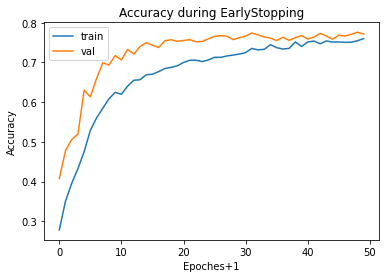

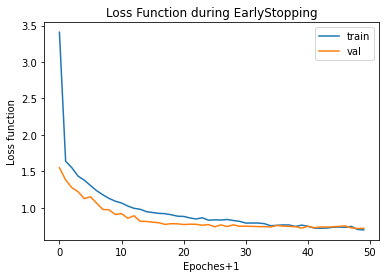

In [ ]:
NN_name = "VGG16+Custom"
image_size = 128
channels = 3
batch_size = 128

train_dataset_aug, val_dataset_aug, test_dataset2 = create_datasets_aug(TRAINDIR, VALDIR, TESTDIR, image_size, batch_size)

img_rows = image_size
img_cols = image_size
kernel_size = 3 # Size of the kernel for the convolution layers
pool_size = 3 # Size of the pooling region for the pooling layers
pool_size2 = 2 # Size of the pooling region for the pooling layers
pool_size3 = 2 # Size of the pooling region for the pooling layers
NN_model = 'VGG16+F+D128+d25+D128+d25+D128+d25+D6'
NN_ActivationFunction = 'softmax'

model3 = Sequential()
model3.add(tensorflow.keras.layers.Lambda(preprocess_input, input_shape=(image_size, image_size, 3)))

model3.add(vgg16_model)
model3.add(Flatten())
model3.add(Dense(128, activation="relu"))
model3.add(Dropout(0.25))
model3.add(Dense(128, activation="relu"))
model3.add(Dropout(0.25))
model3.add(Dense(128, activation="relu"))
model3.add(Dropout(0.25))
model3.add(Dense(6, activation=NN_ActivationFunction))

model3.summary()

NN_optimizer = 'adam'
model3.compile(loss='categorical_crossentropy', optimizer=NN_optimizer, metrics=["accuracy"])

# patient early stopping
NN_TrainingStrategy = 'Bottleneck f.&Augmentation&EarlyStopping&Dropout'
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
mc = ModelCheckpoint('best_model.h5', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
NN_epochs = 50
history = model3.fit(train_dataset_aug, validation_data=(val_dataset_aug), batch_size=batch_size, steps_per_epoch=6082/batch_size, epochs=NN_epochs, verbose=2, callbacks=[es, mc])

model3_saved_model = load_model('best_model.h5')

#score = lenet.evaluate(X_test, Y_test) # Not needed using dataset as input
score = model3_saved_model.evaluate(test_dataset2)
print(f"Image size:  {image_size}x{image_size} - Batches:  {batch_size}")
print(f"Model:  {NN_name} -> {NN_model}")
print(f"Training Strategy:  {NN_TrainingStrategy}")
print(f"Epoches:  {len(history.history['accuracy'])}/{NN_epochs}")
print(f"Test loss:  {score[0]:.3}")
print(f"Test accuracy:  {score[1]:.1%}")
results_table.loc[len(results_table)+1] = [NN_name, (f"{image_size}x{image_size}"), batch_size, NN_model, NN_ActivationFunction, NN_optimizer, NN_TrainingStrategy,
                                           (f"{len(history.history['accuracy'])}/{NN_epochs}"), (f"{score[1]:.1%}")]

# plot training history
pyplot.plot(history.history['accuracy'], label='train')
pyplot.plot(history.history['val_accuracy'], label='val')
pyplot.legend()
pyplot.title('Accuracy during EarlyStopping')
pyplot.xlabel("Epoches+1")
pyplot.ylabel("Accuracy")
pyplot.show()

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='val')
pyplot.legend()
pyplot.title('Loss Function during EarlyStopping')
pyplot.xlabel("Epoches+1")
pyplot.ylabel("Loss function")
pyplot.show()

Found 6082 images belonging to 6 classes.
Found 2108 files belonging to 6 classes.
Found 2070 files belonging to 6 classes.
Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lambda (Lambda)             (None, 128, 128, 3)       0         
                                                                 
 vgg16 (Functional)          (None, 4, 4, 512)         14714688  
                                                                 
 batch_normalization_1 (Batc  (None, 4, 4, 512)        2048      
 hNormalization)                                                 
                                                                 
 flatten_1 (Flatten)         (None, 8192)              0         
                                                                 
 dense_3 (Dense)             (None, 128)               1048704   
                                                              

/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/image_data_generator.py:720: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '
/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/image_data_generator.py:728: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '


Epoch 1/50

Epoch 1: val_accuracy improved from -inf to 0.67078, saving model to best_model.h5
47/47 - 108s - loss: 1.0833 - accuracy: 0.5954 - val_loss: 1.0313 - val_accuracy: 0.6708 - 108s/epoch - 2s/step
Epoch 2/50

Epoch 2: val_accuracy improved from 0.67078 to 0.72296, saving model to best_model.h5
47/47 - 64s - loss: 0.7330 - accuracy: 0.7363 - val_loss: 0.7951 - val_accuracy: 0.7230 - 64s/epoch - 1s/step
Epoch 3/50

Epoch 3: val_accuracy improved from 0.72296 to 0.74905, saving model to best_model.h5
47/47 - 64s - loss: 0.6471 - accuracy: 0.7606 - val_loss: 0.7539 - val_accuracy: 0.7491 - 64s/epoch - 1s/step
Epoch 4/50

Epoch 4: val_accuracy did not improve from 0.74905
47/47 - 69s - loss: 0.5629 - accuracy: 0.7968 - val_loss: 0.7771 - val_accuracy: 0.7405 - 69s/epoch - 1s/step
Epoch 5/50

Epoch 5: val_accuracy improved from 0.74905 to 0.75901, saving model to best_model.h5
47/47 - 64s - loss: 0.5187 - accuracy: 0.8086 - val_loss: 0.7268 - val_accuracy: 0.7590 - 64s/epoch - 1s/s

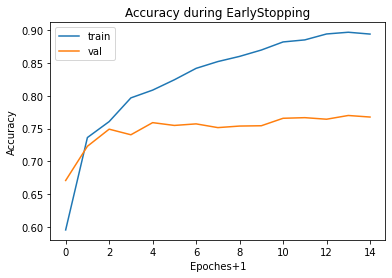

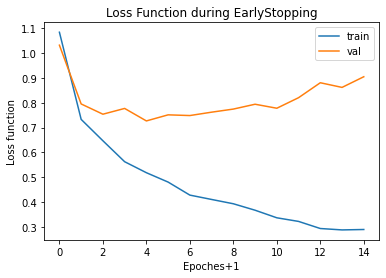

In [ ]:
NN_name = "VGG16+Custom"
image_size = 128
channels = 3
batch_size = 128

train_dataset_aug, val_dataset_aug, test_dataset2 = create_datasets_aug(TRAINDIR, VALDIR, TESTDIR, image_size, batch_size)

img_rows = image_size
img_cols = image_size
kernel_size = 3 # Size of the kernel for the convolution layers
pool_size = 3 # Size of the pooling region for the pooling layers
pool_size2 = 2 # Size of the pooling region for the pooling layers
pool_size3 = 2 # Size of the pooling region for the pooling layers
NN_model = 'VGG16+BN+F+D128+D128+D128+D6'
NN_ActivationFunction = 'softmax'

model4 = Sequential()
model4.add(tensorflow.keras.layers.Lambda(preprocess_input, input_shape=(image_size, image_size, 3)))

model4.add(vgg16_model)
model4.add(BatchNormalization())
model4.add(Flatten())
model4.add(Dense(128))
model4.add(Activation("relu"))
model4.add(Dense(128))
model4.add(Activation("relu"))
model4.add(Dense(128))
model4.add(Activation("relu"))
model4.add(Dense(6, activation=NN_ActivationFunction))

model4.summary()

NN_optimizer = 'adam'
model4.compile(loss='categorical_crossentropy', optimizer=NN_optimizer, metrics=["accuracy"])

# patient early stopping
NN_TrainingStrategy = 'Bottleneck f.&Augmentation&EarlyStopping&BatchNormalization'
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
mc = ModelCheckpoint('best_model.h5', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
NN_epochs = 50
history = model4.fit(train_dataset_aug, validation_data=(val_dataset_aug), batch_size=batch_size, steps_per_epoch=6082/batch_size, epochs=NN_epochs, verbose=2, callbacks=[es, mc])

model4_saved_model = load_model('best_model.h5')

score = model4_saved_model.evaluate(test_dataset2)
print(f"Image size:  {image_size}x{image_size} - Batches:  {batch_size}")
print(f"Model:  {NN_name} -> {NN_model}")
print(f"Training Strategy:  {NN_TrainingStrategy}")
print(f"Epoches:  {len(history.history['accuracy'])}/{NN_epochs}")
print(f"Test loss:  {score[0]:.3}")
print(f"Test accuracy:  {score[1]:.1%}")
results_table.loc[len(results_table)+1] = [NN_name, (f"{image_size}x{image_size}"), batch_size, NN_model, NN_ActivationFunction, NN_optimizer, NN_TrainingStrategy,
                                           (f"{len(history.history['accuracy'])}/{NN_epochs}"), (f"{score[1]:.1%}")]

# plot training history
pyplot.plot(history.history['accuracy'], label='train')
pyplot.plot(history.history['val_accuracy'], label='val')
pyplot.legend()
pyplot.title('Accuracy during EarlyStopping')
pyplot.xlabel("Epoches+1")
pyplot.ylabel("Accuracy")
pyplot.show()

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='val')
pyplot.legend()
pyplot.title('Loss Function during EarlyStopping')
pyplot.xlabel("Epoches+1")
pyplot.ylabel("Loss function")
pyplot.show()

We get overfitting, let's use Dropout to avoid it:

Found 6082 images belonging to 6 classes.
Found 2108 files belonging to 6 classes.
Found 2070 files belonging to 6 classes.
Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lambda_1 (Lambda)           (None, 128, 128, 3)       0         
                                                                 
 vgg16 (Functional)          (None, 4, 4, 512)         14714688  
                                                                 
 flatten_2 (Flatten)         (None, 8192)              0         
                                                                 
 dense_7 (Dense)             (None, 128)               1048704   
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_8 (Dense)             (None, 128)               16512  

/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/image_data_generator.py:720: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '
/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/image_data_generator.py:728: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '


Epoch 1/50

Epoch 1: val_accuracy improved from -inf to 0.68121, saving model to best_model.h5
47/47 - 68s - loss: 1.4191 - accuracy: 0.4515 - val_loss: 0.9850 - val_accuracy: 0.6812 - 68s/epoch - 1s/step
Epoch 2/50

Epoch 2: val_accuracy improved from 0.68121 to 0.70825, saving model to best_model.h5
47/47 - 66s - loss: 1.0047 - accuracy: 0.6330 - val_loss: 0.8465 - val_accuracy: 0.7083 - 66s/epoch - 1s/step
Epoch 3/50

Epoch 3: val_accuracy improved from 0.70825 to 0.73292, saving model to best_model.h5
47/47 - 66s - loss: 0.8805 - accuracy: 0.6856 - val_loss: 0.7797 - val_accuracy: 0.7329 - 66s/epoch - 1s/step
Epoch 4/50

Epoch 4: val_accuracy improved from 0.73292 to 0.75854, saving model to best_model.h5
47/47 - 66s - loss: 0.8287 - accuracy: 0.7055 - val_loss: 0.7208 - val_accuracy: 0.7585 - 66s/epoch - 1s/step
Epoch 5/50

Epoch 5: val_accuracy did not improve from 0.75854
47/47 - 66s - loss: 0.7657 - accuracy: 0.7256 - val_loss: 0.7280 - val_accuracy: 0.7509 - 66s/epoch - 1s/ste

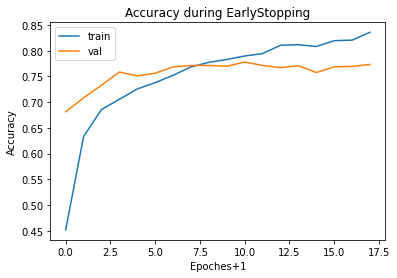

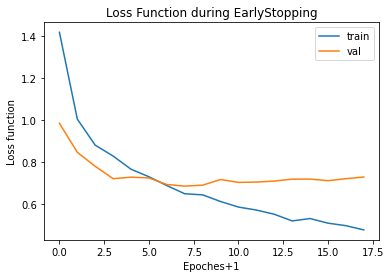

In [ ]:
NN_name = "VGG16+Custom"
image_size = 128
channels = 3
batch_size = 128
#train_dataset, val_dataset, test_dataset = create_datasets(TRAINDIR, VALDIR, TESTDIR, image_size, batch_size)
train_dataset_aug, val_dataset_aug, test_dataset2 = create_datasets_aug(TRAINDIR, VALDIR, TESTDIR, image_size, batch_size)

img_rows = image_size
img_cols = image_size
kernel_size = 3 # Size of the kernel for the convolution layers
pool_size = 3 # Size of the pooling region for the pooling layers
pool_size2 = 2 # Size of the pooling region for the pooling layers
pool_size3 = 2 # Size of the pooling region for the pooling layers
NN_model = 'VGG16+BN+F+D128+d25+D128+d25+D128+d25+D6'
NN_ActivationFunction = 'softmax'

model5 = Sequential()
model5.add(tensorflow.keras.layers.Lambda(preprocess_input, input_shape=(image_size, image_size, 3)))

model5.add(vgg16_model)
model5.add(BatchNormalization())
model5.add(Flatten())
model5.add(Dense(128))
model5.add(Activation("relu"))
model5.add(Dropout(0.25))
model5.add(Dense(128))
model5.add(Activation("relu"))
model5.add(Dropout(0.25))
model5.add(Dense(128))
model5.add(Activation("relu"))
model5.add(Dropout(0.25))
model5.add(Dense(6, activation=NN_ActivationFunction))

model3.summary()

NN_optimizer = 'adam'
model5.compile(loss='categorical_crossentropy', optimizer=NN_optimizer, metrics=["accuracy"])

# patient early stopping
NN_TrainingStrategy = 'Bottleneck f.&Augment&EarlyStop&BatchNorm&Dropout'
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
mc = ModelCheckpoint('best_model.h5', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
NN_epochs = 50
history = model5.fit(train_dataset_aug, validation_data=(val_dataset_aug), batch_size=batch_size, steps_per_epoch=6082/batch_size, epochs=NN_epochs, verbose=2, callbacks=[es, mc])

model5_saved_model = load_model('best_model.h5')

score = model5_saved_model.evaluate(test_dataset2)
print(f"Image size:  {image_size}x{image_size} - Batches:  {batch_size}")
print(f"Model:  {NN_name} -> {NN_model}")
print(f"Training Strategy:  {NN_TrainingStrategy}")
print(f"Epoches:  {len(history.history['accuracy'])}/{NN_epochs}")
print(f"Test loss:  {score[0]:.3}")
print(f"Test accuracy:  {score[1]:.1%}")
results_table.loc[len(results_table)+1] = [NN_name, (f"{image_size}x{image_size}"), batch_size, NN_model, NN_ActivationFunction, NN_optimizer, NN_TrainingStrategy,
                                           (f"{len(history.history['accuracy'])}/{NN_epochs}"), (f"{score[1]:.1%}")]

# plot training history
pyplot.plot(history.history['accuracy'], label='train')
pyplot.plot(history.history['val_accuracy'], label='val')
pyplot.legend()
pyplot.title('Accuracy during EarlyStopping')
pyplot.xlabel("Epoches+1")
pyplot.ylabel("Accuracy")
pyplot.show()

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='val')
pyplot.legend()
pyplot.title('Loss Function during EarlyStopping')
pyplot.xlabel("Epoches+1")
pyplot.ylabel("Loss function")
pyplot.show()

Found 6082 images belonging to 6 classes.
Found 2108 files belonging to 6 classes.
Found 2070 files belonging to 6 classes.
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lambda (Lambda)             (None, 256, 256, 3)       0         
                                                                 
 vgg16 (Functional)          (None, 8, 8, 512)         14714688  
                                                                 
 batch_normalization (BatchN  (None, 8, 8, 512)        2048      
 ormalization)                                                   
                                                                 
 flatten (Flatten)           (None, 32768)             0         
                                                                 
 dense (Dense)               (None, 128)               4194432   
                                                                

/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/image_data_generator.py:720: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '
/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/image_data_generator.py:728: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '


Epoch 1/50

Epoch 1: val_accuracy improved from -inf to 0.72391, saving model to best_model.h5
47/47 - 234s - loss: 1.3171 - accuracy: 0.5133 - val_loss: 1.1342 - val_accuracy: 0.7239 - 234s/epoch - 5s/step
Epoch 2/50

Epoch 2: val_accuracy improved from 0.72391 to 0.78653, saving model to best_model.h5
47/47 - 158s - loss: 0.9012 - accuracy: 0.6881 - val_loss: 0.7252 - val_accuracy: 0.7865 - 158s/epoch - 3s/step
Epoch 3/50

Epoch 3: val_accuracy improved from 0.78653 to 0.79744, saving model to best_model.h5
47/47 - 158s - loss: 0.8082 - accuracy: 0.7239 - val_loss: 0.6084 - val_accuracy: 0.7974 - 158s/epoch - 3s/step
Epoch 4/50

Epoch 4: val_accuracy improved from 0.79744 to 0.81499, saving model to best_model.h5
47/47 - 158s - loss: 0.6797 - accuracy: 0.7657 - val_loss: 0.5725 - val_accuracy: 0.8150 - 158s/epoch - 3s/step
Epoch 5/50

Epoch 5: val_accuracy improved from 0.81499 to 0.82590, saving model to best_model.h5
47/47 - 157s - loss: 0.6238 - accuracy: 0.7886 - val_loss: 0.5499

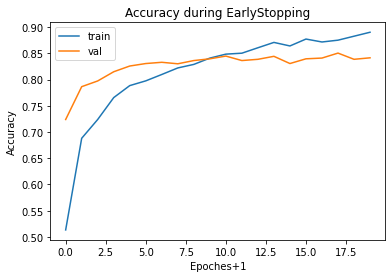

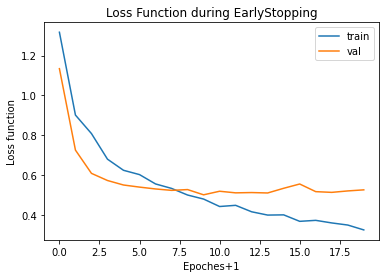

In [23]:
from tensorflow.keras.applications import VGG16

NN_name = "VGG16+Custom"
image_size = 256
vgg16_model = VGG16(include_top=False, input_shape=(image_size, image_size, 3))

vgg16_model.trainable = False
from keras.applications.vgg16 import preprocess_input

from keras.layers import Lambda
channels = 3
batch_size = 128
#train_dataset, val_dataset, test_dataset = create_datasets(TRAINDIR, VALDIR, TESTDIR, image_size, batch_size)
train_dataset_aug, val_dataset_aug, test_dataset2 = create_datasets_aug(TRAINDIR, VALDIR, TESTDIR, image_size, batch_size)

img_rows = image_size
img_cols = image_size
kernel_size = 3 # Size of the kernel for the convolution layers
pool_size = 3 # Size of the pooling region for the pooling layers
pool_size2 = 2 # Size of the pooling region for the pooling layers
pool_size3 = 2 # Size of the pooling region for the pooling layers
NN_model = 'VGG16+BN+F+D128+d25+D128+d25+D128+d25+D6'
NN_ActivationFunction = 'softmax'

model6 = Sequential()
model6.add(tensorflow.keras.layers.Lambda(preprocess_input, input_shape=(image_size, image_size, 3)))

model6.add(vgg16_model)
model6.add(BatchNormalization())
model6.add(Flatten())
model6.add(Dense(128))
model6.add(Activation("relu"))
model6.add(Dropout(0.25))
model6.add(Dense(128))
model6.add(Activation("relu"))
model6.add(Dropout(0.25))
model6.add(Dense(128))
model6.add(Activation("relu"))
model6.add(Dropout(0.25))
model6.add(Dense(6, activation=NN_ActivationFunction))

model6.summary()

NN_optimizer = 'adam'
model6.compile(loss='categorical_crossentropy', optimizer=NN_optimizer, metrics=["accuracy"])

# patient early stopping
NN_TrainingStrategy = 'Bottleneck f.&Augment&EarlyStop&BatchNorm&Dropout'
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
mc = ModelCheckpoint('best_model.h5', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
NN_epochs = 50
history = model6.fit(train_dataset_aug, validation_data=(val_dataset_aug), batch_size=batch_size, steps_per_epoch=6082/batch_size, epochs=NN_epochs, verbose=2, callbacks=[es, mc])

model6_saved_model = load_model('best_model.h5')

score = model6_saved_model.evaluate(test_dataset2)
print(f"Image size:  {image_size}x{image_size} - Batches:  {batch_size}")
print(f"Model:  {NN_name} -> {NN_model}")
print(f"Training Strategy:  {NN_TrainingStrategy}")
print(f"Epoches:  {len(history.history['accuracy'])}/{NN_epochs}")
print(f"Test loss:  {score[0]:.3}")
print(f"Test accuracy:  {score[1]:.1%}")
results_table.loc[len(results_table)+1] = [NN_name, (f"{image_size}x{image_size}"), batch_size, NN_model, NN_ActivationFunction, NN_optimizer, NN_TrainingStrategy,
                                           (f"{len(history.history['accuracy'])}/{NN_epochs}"), (f"{score[1]:.1%}")]

# plot training history
pyplot.plot(history.history['accuracy'], label='train')
pyplot.plot(history.history['val_accuracy'], label='val')
pyplot.legend()
pyplot.title('Accuracy during EarlyStopping')
pyplot.xlabel("Epoches+1")
pyplot.ylabel("Accuracy")
pyplot.show()

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='val')
pyplot.legend()
pyplot.title('Loss Function during EarlyStopping')
pyplot.xlabel("Epoches+1")
pyplot.ylabel("Loss function")
pyplot.show()

## Summary of results

This is a short report explaining what network designs we tried, and what test accuracies we obtained:

In [6]:
results_table

,Convolutional Necwork Name,Image Size,Batch Size,Neural Network Model,Activation Function,Optimizer,Training Strategy,Epochs,Test Accuracy
1,Extremly Simple,32x32,64,"C4,3+F+D6",softmax,adam,Train from scratch,5,41.9%
2,Short,32x32,64,"C32,3+P2+F+D6",softmax,adam,Train from scratch,20,44.5%
3,Short,32x32,64,"C32,3+P2+F+D6",softmax,adam,Train from scratch & EarlyStopping,9/20,44.3%
4,Large,32x32,64,"C32,3+C32,3+P2+D128+F+D66",softmax,adam,Train from scratch & EarlyStopping,14/50,46.4%
5,Large,32x32,64,"C32,3+C32,3+P2+F+D128+d5+D6",softmax,adam,Train from scratch & EarlyStopping & Dropout,15/50,48.4%
6,Large,64x64,64,"C32,3+C32,3+P2+F+D128+d5+D6",softmax,adam,Train from scratch & EarlyStopping & Dropout,13/50,46.6%
7,Superlarge,128x128,128,"C32,3+P3+C32,3+P2+C32,3+P2+F+D128+D128+D6",softmax,adam,Train from scratch & EarlyStopping,18/50,52.0%
8,Superlarge,128x128,128,"C32,3+P3+C32,3+P2+C32,3+P2+F+D128+d25+D128+d25+D6",softmax,adam,Train from scratch & EarlyStopping & Dropout,21/50,53.6%
9,Superlarge,128x128,128,"C32,3+P3+C32,3+P2+C32,3+P2+F+D128+d5+D128+d5+D6",softmax,adam,Train from scratch & EarlyStopping & Dropout,28/50,53.8%
10,LeNet,32x32,64,"C32,5+P2+C50,5+P2+F+D256+d5+D6",softmax,adam,Train from scratch & EarlyStopping & Dropout,16/50,47.8%


Conclusions:
- EarlyStopping is really useful and optimazes the training of the network, as it allows to choose the right number of epoches no matter the time needed to train the network. If the networj can decrese the error it will but if not it will stop training. Also it allows to find the absolut minimums  mínimos aboluots discriminating the local minimums.
- The more hidden layers, the more overfitting and the more dropout is needed.
- With Transfer Learning we get better results in short space of time.
- It has been found that each time a model is executed, different results are obtained due to the random initialization of the neuron weights and, therefore, the initial point at which the error gradient descent begins.   
- Best results are obtained when the size of the images that arrive at the Flatten are smaller than 10x10. Starting with the "Superlarge" networks, this standard has always been respected.